In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from pathlib import Path
import shutil

sns.set()
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5)
plt.rcParams['font.size'] = 18
plt.rcParams['font.family'] = 'serif'
plt.rcParams['mathtext.fontset'] = 'cm'
USE_TEX = shutil.which('latex') is not None
plt.rcParams['text.usetex'] = USE_TEX
print(f"Matplotlib text rendering: {'LaTeX' if USE_TEX else 'mathtext fallback'}")

import torch
from torch import nn

from nflows.flows import Flow
from nflows.distributions import StandardNormal
from nflows.transforms import (
    CompositeTransform, InverseTransform,
    PiecewiseRationalQuadraticCouplingTransform,
    RandomPermutation,
    Sigmoid,
)

from Amplitude import DKpp, AmpSample, SquareDalitzPlot2
from DKpp import DKppCorrelated


Matplotlib text rendering: LaTeX


In [2]:
class MLP(nn.Module):
    def __init__(self, in_features, out_features,
                 hidden=64, layers=2, output_scale=0.30):
        super().__init__()
        feats = [nn.Linear(in_features, hidden), nn.SiLU()]
        for _ in range(layers - 1):
            feats += [nn.Linear(hidden, hidden), nn.SiLU()]
        self.backbone = nn.Sequential(*feats)
        self.head = nn.Linear(hidden, out_features)

        nn.init.zeros_(self.head.weight)
        nn.init.zeros_(self.head.bias)
        self.output_scale = output_scale

    def forward(self, x, context=None):
        h = self.backbone(x)
        return self.head(h) * self.output_scale


In [4]:
def create_flow(on_unit_box=True, num_flows=12, hidden_features=128,
                num_bins=24, device=None):
    """
    Create a rational-quadratic neural spline flow on [0,1]^2.
    Architecture matches the training notebooks exactly.
    """
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    dim = 2
    transforms = []

    if on_unit_box:
        sigmoid = Sigmoid()
        if hasattr(sigmoid, "temperature") and isinstance(sigmoid.temperature, torch.Tensor):
            sigmoid.temperature = sigmoid.temperature.to(device)
        if hasattr(sigmoid, "eps") and isinstance(sigmoid.eps, torch.Tensor):
            sigmoid.eps = sigmoid.eps.to(device)
        transforms.append(InverseTransform(sigmoid))

    masks = [torch.tensor([1, 0], dtype=torch.bool),
             torch.tensor([0, 1], dtype=torch.bool)]

    for i in range(num_flows):
        def _conditioner(in_f, out_f, _h=hidden_features):
            return MLP(in_f, out_f, hidden=_h, layers=2)

        transforms.append(
            PiecewiseRationalQuadraticCouplingTransform(
                mask=masks[i % 2],
                transform_net_create_fn=_conditioner,
                num_bins=num_bins,
                tails="linear",
                tail_bound=5.0,
                apply_unconditional_transform=False,
            )
        )
        transforms.append(RandomPermutation(features=dim))

    return Flow(
        transform=CompositeTransform(transforms),
        distribution=StandardNormal([dim]),
    )

def load_flow_state_compat(flow, path, map_location=None):
    """
    Load a flow checkpoint while tolerating the `Sigmoid.temperature` / `eps`
    buffer differences that can appear across `nflows` versions.
    """
    state = torch.load(path, map_location=map_location)
    model_state = flow.state_dict()

    missing = [k for k in model_state.keys() if k not in state]
    unexpected = [k for k in state.keys() if k not in model_state]

    allowed_tokens = ("temperature", "eps")
    bad_missing = [k for k in missing if not any(tok in k for tok in allowed_tokens)]
    bad_unexpected = [k for k in unexpected if not any(tok in k for tok in allowed_tokens)]
    if bad_missing or bad_unexpected:
        raise RuntimeError(
            "Checkpoint/model mismatch goes beyond the known Sigmoid buffer issue. "
            f"Missing: {bad_missing[:5]} Unexpected: {bad_unexpected[:5]}"
        )

    for key in missing:
        state[key] = model_state[key]
    for key in unexpected:
        state.pop(key)

    if missing or unexpected:
        print("Applied checkpoint compatibility fix:")
        if missing:
            print("  filled missing keys:", missing)
        if unexpected:
            print("  dropped unexpected keys:", unexpected)

    flow.load_state_dict(state, strict=False)
    return flow


In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")


Using cpu device


In [ ]:
# Symmetric-SDP plotting configuration.
# Switch FLOW_KIND to one of: "flavor", "even", "odd".
FLOW_KIND = "flavor"

# Keep these modest for a responsive first pass; increase if you want smoother plots.
N_TARGET = 1_000_000
N_SAMPLES = 2_000_000
N_NORM_GRID = 350
N_DENSITY_GRID = 250
N_MARGINAL_X = 400
N_MARGINAL_Y = 800
SLICE_VALUES = np.linspace(0.2, 0.8, 4)
SAVE_PREFIX = f"draft_figures_symmetric_{FLOW_KIND}"

# Symmetric SDP convention: the resonant pair is pi+ pi-, so m' is built from s23.
idx = (2, 3, 1)
mD, mKs, mpi = 1.86483, 0.497611, 0.13957018
sdp_obj = SquareDalitzPlot2(mD, mKs, mpi, mpi)
_sum_m2 = sdp_obj.mSq[0] + sdp_obj.mSq[1] + sdp_obj.mSq[2] + sdp_obj.mSq[3]

dkpp_flavor = DKpp()
dkpp_even = DKppCorrelated(cp=+1)
dkpp_odd = DKppCorrelated(cp=-1)

FLOW_CONFIG = {
    "flavor": {
        "title": r"Flavor $D^0$",
        "label": r"$|A_D|^2$",
        "ckpt": "flavor_SDP_sym_2e6/trial_seed1.pth",
        "exact_model": dkpp_flavor,
    },
    "even": {
        "title": r"CP-even $D_+$",
        "label": r"$|A_D + \bar A_D|^2 / 2$",
        "ckpt": "even_SDP_sym_2e6/trial_seed1.pth",
        "exact_model": dkpp_even,
    },
    "odd": {
        "title": r"CP-odd $D_-$",
        "label": r"$|A_D - \bar A_D|^2 / 2$",
        "ckpt": "odd_SDP_sym_2e6/trial_seed1.pth",
        "exact_model": dkpp_odd,
    },
}

cfg = FLOW_CONFIG[FLOW_KIND]
print(f"Plotting symmetric comparison for {cfg['title']} from {cfg['ckpt']}")


def _finite_pos(x, eps=1e-14):
    x = np.asarray(x, dtype=float)
    x = np.where(np.isfinite(x), x, 0.0)
    return np.maximum(x, eps)


def dp_to_sdp(points_dp, sdp_obj=sdp_obj, idx=idx):
    i, j, k = idx
    s12, s13 = points_dp[:, 0], points_dp[:, 1]
    s23 = _sum_m2 - s12 - s13
    mp = np.vectorize(lambda a, b: sdp_obj.MpfromM(a, b, i, j, k), otypes=[float])(s23, s12)
    tp = np.vectorize(lambda a, b: sdp_obj.TfromM(a, b, i, j, k), otypes=[float])(s23, s12)
    return np.column_stack([mp, tp])


def sdp_to_dp(points_sdp, sdp_obj=sdp_obj, idx=idx):
    i, j, k = idx
    out = np.empty_like(points_sdp, dtype=float)
    for n, (mp, tp) in enumerate(points_sdp):
        s23, s12 = sdp_obj.M_from_MpT(mp, tp, i, j, k)
        out[n, 0] = s12
        out[n, 1] = _sum_m2 - s23 - s12
    return out


def exact_sdp_density_raw(points_sdp, kind=FLOW_KIND):
    dp = sdp_to_dp(points_sdp, sdp_obj, idx)
    s12, s13 = dp[:, 0], dp[:, 1]
    s23 = _sum_m2 - s12 - s13

    amp = FLOW_CONFIG[kind]["exact_model"].full(np.column_stack([s12, s13]))
    i, j, k = idx
    J = np.array([
        float(sdp_obj.jacobian(s23[n], s12[n], i, j, k))
        for n in range(len(points_sdp))
    ])
    invJ = _finite_pos(1.0 / J)
    return np.abs(amp) ** 2 * invJ


_exact_norm_cache = {}


def exact_norm(kind=FLOW_KIND, n_grid=N_NORM_GRID):
    key = (kind, n_grid)
    if key not in _exact_norm_cache:
        eps = 1e-6
        u = np.linspace(eps, 1.0 - eps, n_grid)
        v = np.linspace(eps, 1.0 - eps, n_grid)
        U, V = np.meshgrid(u, v, indexing="xy")
        pts = np.column_stack([U.ravel(), V.ravel()])
        dens = exact_sdp_density_raw(pts, kind=kind).reshape(len(v), len(u))
        norm = np.trapz(np.trapz(dens, u, axis=1), v, axis=0)
        _exact_norm_cache[key] = norm
    return _exact_norm_cache[key]


def exact_sdp_density(points_sdp, kind=FLOW_KIND):
    return exact_sdp_density_raw(points_sdp, kind=kind) / exact_norm(kind=kind)


def sample_exact_sdp(n_samples=N_TARGET, kind=FLOW_KIND, seed=1234):
    np.random.seed(seed)
    sampler = AmpSample(FLOW_CONFIG[kind]["exact_model"])
    points_dp = sampler.generate(n_samples, nbatch=20_000)
    return dp_to_sdp(points_dp, sdp_obj, idx)


In [ ]:
# Load the symmetric normalizing flow and the representative isobar reference sample.
n_blocks = 12
n_bins = 24
hidden_features = 128

flow = create_flow(num_flows=n_blocks, hidden_features=hidden_features, num_bins=n_bins, device=device)
flow = load_flow_state_compat(flow, cfg["ckpt"], map_location=device)
flow = flow.to(device).eval()

total_params = sum(p.numel() for p in flow.parameters())
print(f"Total # of parameters: {total_params}")

mp_thetap = np.load(f'representative data/dataset_001_{FLOW_KIND}.npy')
print(f"Loaded representative reference sample with {len(mp_thetap):,} events")


In [8]:
flow.eval()
flow.to(device)

with torch.no_grad():
    mp_thetap_gen = flow.sample(N_SAMPLES).cpu().numpy()

mp_thetap_gen = np.clip(mp_thetap_gen, 1e-6, 1.0 - 1e-6)
print(f"Generated {len(mp_thetap_gen):,} flow events")


/Users/san/opt/anaconda3/lib/python3.9/site-packages/nflows/transforms/coupling.py:561: UserWarning: Inputs to the softmax are not scaled down: initialization might be bad.
  warnings.warn(


Generated 1,000,000 flow events


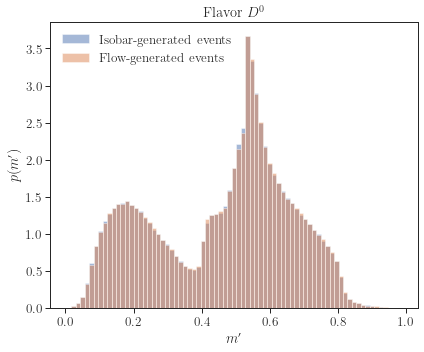

In [9]:
# Visualize m' projection
fig, ax = plt.subplots(figsize=(6, 5))
counts, bins, _ = ax.hist(
    mp_thetap[:, 0], 75, alpha=0.5, label='Isobar-generated events', density=True
)
ax.hist(
    mp_thetap_gen[:, 0], bins, alpha=0.5, label='Flow-generated events', density=True
)

ax.set_xlabel(r"$m'$")
ax.set_ylabel(r'$p(m^\prime)$')
ax.set_title(cfg["title"])
ax.legend(loc='best', frameon=False)
fig.tight_layout()


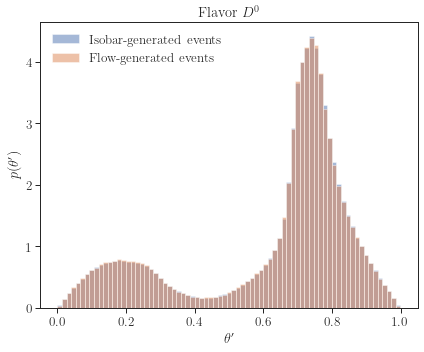

In [10]:
# Visualize theta' projection
fig, ax = plt.subplots(figsize=(6, 5))
counts, bins, _ = ax.hist(
    mp_thetap[:, 1], 75, alpha=0.5, label='Isobar-generated events', density=True
)
ax.hist(
    mp_thetap_gen[:, 1], bins, alpha=0.5, label='Flow-generated events', density=True
)

ax.set_xlabel(r"$\theta'$")
ax.set_ylabel(r'$p(\theta^\prime)$')
ax.set_title(cfg["title"])
ax.legend(loc='best', frameon=False)
fig.tight_layout()


/var/folders/k9/p5b9wydx1kn33thc8p74blx40000gn/T/ipykernel_48455/2230297094.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


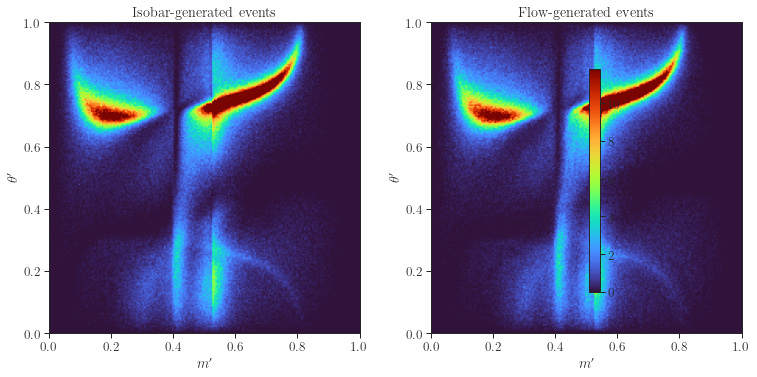

In [11]:
# Visualize the 2D SDP density with a common colour scale
xbins = np.linspace(0, 1, 201)
ybins = np.linspace(0, 1, 201)

h_exact, _, _ = np.histogram2d(mp_thetap[:, 0], mp_thetap[:, 1], bins=[xbins, ybins], density=True)
h_gen, _, _ = np.histogram2d(mp_thetap_gen[:, 0], mp_thetap_gen[:, 1], bins=[xbins, ybins], density=True)

vmax = np.nanpercentile(np.concatenate([h_exact.ravel(), h_gen.ravel()]), 99)
extent = [xbins[0], xbins[-1], ybins[0], ybins[-1]]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10.5, 5))
im1 = ax1.imshow(h_exact.T, origin='lower', extent=extent, cmap='turbo', vmin=0.0, vmax=vmax, aspect='equal')
im2 = ax2.imshow(h_gen.T, origin='lower', extent=extent, cmap='turbo', vmin=0.0, vmax=vmax, aspect='equal')

ax1.set_title('Isobar-generated events')
ax2.set_title('Flow-generated events')
for ax in (ax1, ax2):
    ax.set_xlabel(r"$m'$")
    ax.set_ylabel(r"$\theta'$")

fig.colorbar(im2, ax=[ax1, ax2], shrink=0.82)
fig.tight_layout()


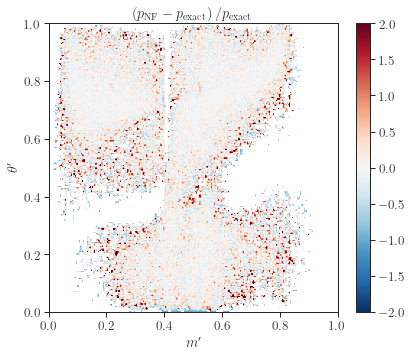

In [12]:
# Per-bin fractional difference, masking bins with negligible exact density
fig, ax = plt.subplots(figsize=(6, 5))
frac_diff = np.full_like(h_exact, np.nan)
mask = h_exact > np.nanpercentile(h_exact[h_exact > 0], 5)
frac_diff[mask] = (h_gen[mask] - h_exact[mask]) / h_exact[mask]

vlim = np.nanpercentile(np.abs(frac_diff[mask]), 98)
im = ax.imshow(
    frac_diff.T,
    origin='lower',
    extent=extent,
    cmap='RdBu_r',
    vmin=-vlim,
    vmax=vlim,
    aspect='equal',
)
ax.set_xlabel(r"$m'$")
ax.set_ylabel(r"$\theta'$")
ax.set_title(r'$\left(p_{\mathrm{NF}}-p_{\mathrm{exact}}\right) / p_{\mathrm{exact}}$')
fig.colorbar(im, ax=ax)
fig.tight_layout()


In [13]:
@torch.no_grad()
def marginal_likelihood(flow, axis=0, xs=None, nx=400, ny=800,
                        on_unit_box=True, eps=1e-8, data_range=None,
                        batch=65536, device=None):
    """
    Compute the 1D marginal learned by the flow along one SDP axis.
    axis=0 returns p(m'), axis=1 returns p(theta').
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    flow = flow.to(device).eval()

    if on_unit_box:
        xmin, xmax = eps, 1.0 - eps
        ymin, ymax = eps, 1.0 - eps
    else:
        if data_range is None:
            xmin, xmax = -3.0, 3.0
            ymin, ymax = -3.0, 3.0
        else:
            (xmin, xmax), (ymin, ymax) = data_range

    if xs is None:
        xs = np.linspace(xmin, xmax, nx, dtype=np.float32)
    else:
        xs = np.asarray(xs, dtype=np.float32)
        nx = xs.shape[0]

    ys = np.linspace(ymin, ymax, ny, dtype=np.float32)

    if axis == 0:
        XX = np.tile(xs, (ny, 1))
        YY = np.tile(ys[:, None], (1, nx))
    else:
        XX = np.tile(ys[:, None], (1, nx))
        YY = np.tile(xs, (ny, 1))

    grid = np.stack([XX.ravel(), YY.ravel()], axis=1).astype(np.float32)
    grid_t = torch.from_numpy(grid).to(device)

    outs = []
    for i in range(0, grid_t.shape[0], batch):
        outs.append(flow.log_prob(grid_t[i:i + batch]))
    logp = torch.cat(outs, dim=0).view(ny, nx)

    dy = (ymax - ymin) / (ny - 1)
    log_marg = torch.logsumexp(logp, dim=0) + torch.log(torch.tensor(dy, device=device))
    return xs, np.exp(log_marg.detach().cpu().numpy())


In [14]:
mprime_flow, dens_m_flow = marginal_likelihood(
    flow, axis=0, on_unit_box=True, nx=N_MARGINAL_X, ny=N_MARGINAL_Y, eps=1e-8, device=device
)
theta_flow, dens_theta_flow = marginal_likelihood(
    flow, axis=1, on_unit_box=True, nx=N_MARGINAL_X, ny=N_MARGINAL_Y, eps=1e-8, device=device
)

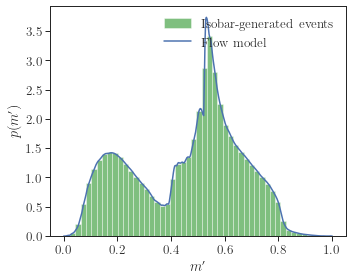

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
ax.hist(mp_thetap[:, 0], 50, alpha=0.5, label='Isobar-generated events', density=True, color='green')
ax.plot(mprime_flow, dens_m_flow, lw=1.5, label='Flow model')
ax.legend(loc='best', frameon=False)
ax.set_xlabel(r"$m'$")
ax.set_ylabel(r'$p(m^\prime)$')
fig.tight_layout()


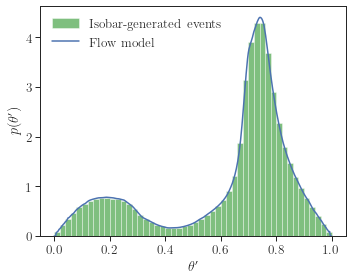

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
ax.hist(mp_thetap[:, 1], 50, alpha=0.5, label='Isobar-generated events', density=True, color='green')
ax.plot(theta_flow, dens_theta_flow, lw=1.5, label='Flow model')
ax.legend(loc='best', frameon=False)
ax.set_xlabel(r"$\theta'$")
ax.set_ylabel(r'$p(\theta^\prime)$')
fig.tight_layout()


In [ ]:
def exact_density_grid(kind=FLOW_KIND, n_grid=N_DENSITY_GRID, eps=1e-6):
    u = np.linspace(eps, 1.0 - eps, n_grid)
    v = np.linspace(eps, 1.0 - eps, n_grid)
    U, V = np.meshgrid(u, v, indexing='xy')
    pts = np.column_stack([U.ravel(), V.ravel()])
    dens = exact_sdp_density(pts, kind=kind).reshape(len(v), len(u))
    return u, v, dens


@torch.no_grad()
def flow_density_grid(flow, n_grid=N_DENSITY_GRID, eps=1e-6, batch=65536, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    u = np.linspace(eps, 1.0 - eps, n_grid, dtype=np.float32)
    v = np.linspace(eps, 1.0 - eps, n_grid, dtype=np.float32)
    U, V = np.meshgrid(u, v, indexing='xy')
    pts = np.column_stack([U.ravel(), V.ravel()]).astype(np.float32)
    pts_t = torch.from_numpy(pts).to(device)

    outs = []
    flow = flow.to(device).eval()
    for i in range(0, len(pts_t), batch):
        outs.append(flow.log_prob(pts_t[i:i + batch]))
    logp = torch.cat(outs, dim=0).cpu().numpy()
    return u, v, np.exp(logp).reshape(len(v), len(u))


mprime_exact, theta_exact, dens_exact_2d = exact_density_grid(FLOW_KIND)
_, _, dens_flow_2d = flow_density_grid(flow, device=device)

dens_m_exact = np.trapz(dens_exact_2d, theta_exact, axis=0)
dens_theta_exact = np.trapz(dens_exact_2d, mprime_exact, axis=1)


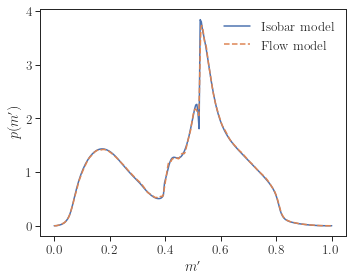

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
ax.plot(mprime_exact, dens_m_exact, lw=1.5, label='Isobar model')
ax.plot(mprime_flow, dens_m_flow, '--', lw=1.5, label='Flow model')
ax.set_xlabel(r"$m'$")
ax.set_ylabel(r'$p(m^\prime)$')
ax.legend(loc='best', frameon=False)
fig.tight_layout()


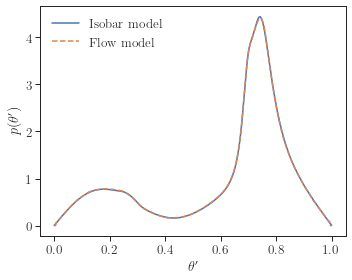

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))
ax.plot(theta_exact, dens_theta_exact, lw=1.5, label='Isobar model')
ax.plot(theta_flow, dens_theta_flow, '--', lw=1.5, label='Flow model')
ax.set_xlabel(r"$\theta'$")
ax.set_ylabel(r'$p(\theta^\prime)$')
ax.legend(loc='best', frameon=False)
fig.tight_layout()


In [23]:
@torch.no_grad()
def conditional_pdf(flow, fixed_value, fixed_axis=0, nx=400, on_unit_box=True,
                    eps=1e-8, data_range=None, batch=65536, device=None):
    """
    Return a normalized 1D conditional from the flow.
    fixed_axis=0: p(theta' | m' = fixed_value)
    fixed_axis=1: p(m' | theta' = fixed_value)
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    flow = flow.to(device).eval()

    if on_unit_box:
        xs = np.linspace(eps, 1.0 - eps, nx, dtype=np.float32)
    else:
        if data_range is None:
            xmin, xmax = -3.0, 3.0
        else:
            (xmin, xmax), _ = data_range
        xs = np.linspace(xmin, xmax, nx, dtype=np.float32)

    fixed = np.full_like(xs, fixed_value)
    if fixed_axis == 0:
        grid = np.column_stack([fixed, xs]).astype(np.float32)
    else:
        grid = np.column_stack([xs, fixed]).astype(np.float32)

    grid_t = torch.from_numpy(grid).to(device)
    outs = []
    for i in range(0, grid_t.shape[0], batch):
        outs.append(flow.log_prob(grid_t[i:i + batch]))
    logp = torch.cat(outs, dim=0).cpu().numpy()
    pdf = np.exp(logp)
    pdf = pdf / np.trapz(pdf, xs)
    return xs, pdf


In [24]:
def exact_conditional_theta_given_mprime(mprime, kind=FLOW_KIND, n_theta=400):
    theta = np.linspace(1e-6, 1.0 - 1e-6, n_theta)
    pts = np.column_stack([np.full_like(theta, mprime), theta])
    pdf = exact_sdp_density(pts, kind=kind)
    pdf = pdf / np.trapz(pdf, theta)
    return theta, pdf


def exact_conditional_mprime_given_theta(theta, kind=FLOW_KIND, n_mprime=400):
    mprime = np.linspace(1e-6, 1.0 - 1e-6, n_mprime)
    pts = np.column_stack([mprime, np.full_like(mprime, theta)])
    pdf = exact_sdp_density(pts, kind=kind)
    pdf = pdf / np.trapz(pdf, mprime)
    return mprime, pdf


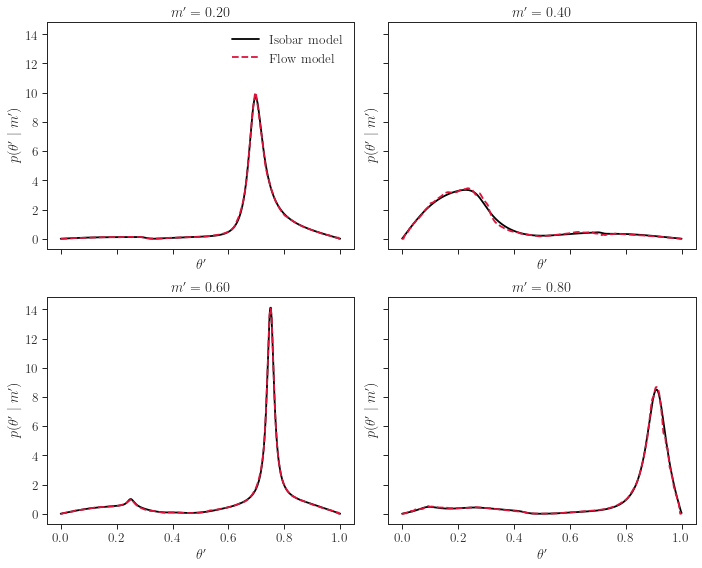

In [25]:
# Compare p(theta' | m') slices between the exact amplitude model and the symmetric flow
mprime_slices = SLICE_VALUES
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)
axs = axs.ravel()

for ax, m0 in zip(axs, mprime_slices):
    theta_ex, pdf_ex = exact_conditional_theta_given_mprime(m0, kind=FLOW_KIND)
    theta_nf, pdf_nf = conditional_pdf(flow, fixed_value=m0, fixed_axis=0, nx=400, device=device)

    ax.plot(theta_ex, pdf_ex, color='black', lw=1.8, label='Isobar model')
    ax.plot(theta_nf, pdf_nf, '--', color='crimson', lw=1.8, label='Flow model')
    ax.set_title(fr"$m' = {m0:.2f}$")
    ax.set_xlabel(r"$\theta'$")
    ax.set_ylabel(r'$p(\theta^\prime \mid m^\prime)$')

axs[0].legend(frameon=False)
fig.tight_layout()


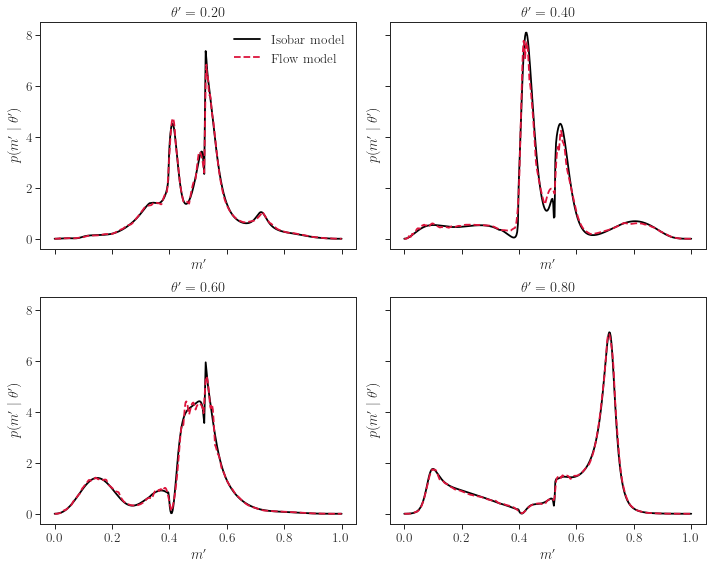

In [26]:
# Compare p(m' | theta') slices between the exact amplitude model and the symmetric flow
theta_slices = SLICE_VALUES
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)
axs = axs.ravel()

for ax, theta0 in zip(axs, theta_slices):
    m_ex, pdf_ex = exact_conditional_mprime_given_theta(theta0, kind=FLOW_KIND)
    m_nf, pdf_nf = conditional_pdf(flow, fixed_value=theta0, fixed_axis=1, nx=400, device=device)

    ax.plot(m_ex, pdf_ex, color='black', lw=1.8, label='Isobar model')
    ax.plot(m_nf, pdf_nf, '--', color='crimson', lw=1.8, label='Flow model')
    ax.set_title(fr"$\theta' = {theta0:.2f}$")
    ax.set_xlabel(r"$m'$")
    ax.set_ylabel(r'$p(m^\prime \mid \theta^\prime)$')

axs[0].legend(frameon=False)
fig.tight_layout()


In [27]:
from symmetric_figure_helpers import (
    plot_joint_marginals_density,
    plot_joint_marginals_samples,
    plot_conditionals_around_main,
)


def conditional_pdf_for_helpers(*, fixed_value, fixed_axis, nx=400):
    return conditional_pdf(
        flow,
        fixed_value=fixed_value,
        fixed_axis=fixed_axis,
        nx=nx,
        device=device,
    )


In [32]:
import importlib
import symmetric_figure_helpers
importlib.reload(symmetric_figure_helpers)

from symmetric_figure_helpers import (
    plot_joint_marginals_density,
    plot_joint_marginals_samples,
    plot_conditionals_around_main,
    plot_C_comparison_density,
    plot_absS_comparison_density,
    plot_S2_comparison_density,
)


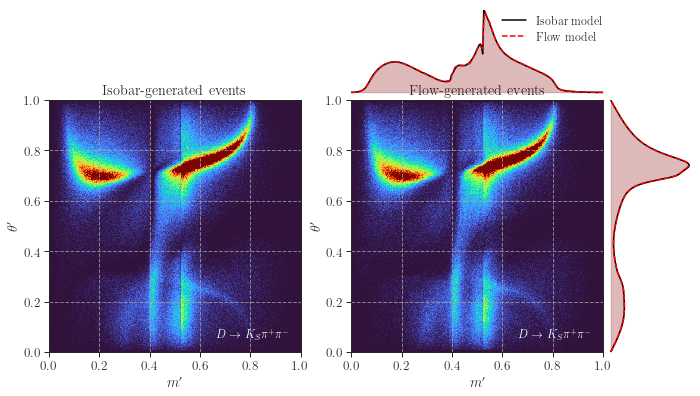

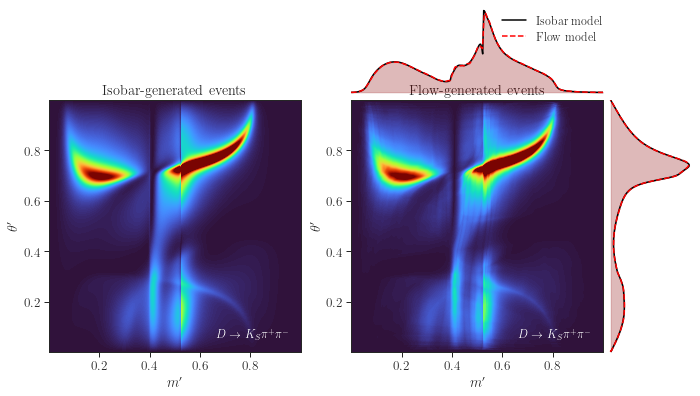

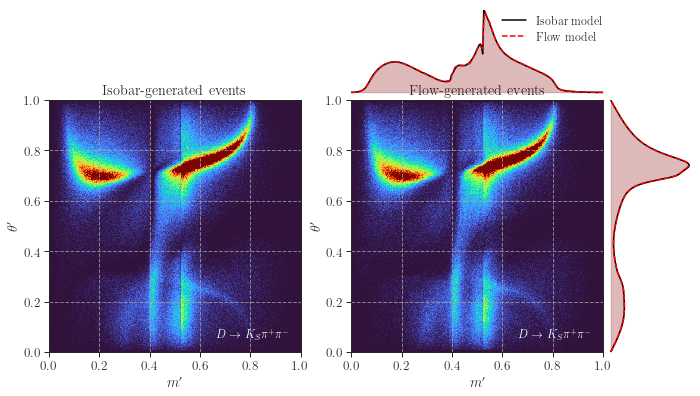

In [29]:
# Big comparison plots: density-map version and scatter-sample version
plot_joint_marginals_density(
    dens_exact_2d=dens_exact_2d,
    dens_flow_2d=dens_flow_2d,
    mprime_exact=mprime_exact,
    theta_exact=theta_exact,
    dens_m_exact=dens_m_exact,
    dens_theta_exact=dens_theta_exact,
    mprime_flow=mprime_flow,
    theta_flow=theta_flow,
    dens_m_flow=dens_m_flow,
    dens_theta_flow=dens_theta_flow,
    title_left="Isobar-generated events",
    title_right="Flow-generated events",
    sample_label=None,
    savepath=f"{SAVE_PREFIX}_joint_marginals_density.pdf",
)

plot_joint_marginals_samples(
    exact_samples=mp_thetap,
    flow_samples=mp_thetap_gen,
    mprime_exact=mprime_exact,
    theta_exact=theta_exact,
    dens_m_exact=dens_m_exact,
    dens_theta_exact=dens_theta_exact,
    mprime_flow=mprime_flow,
    theta_flow=theta_flow,
    dens_m_flow=dens_m_flow,
    dens_theta_flow=dens_theta_flow,
    title_left="Isobar-generated events",
    title_right="Flow-generated events",
    sample_label=None,
    savepath=f"{SAVE_PREFIX}_joint_marginals_scatter.pdf",
)


/Users/san/opt/anaconda3/lib/python3.9/site-packages/nflows/transforms/coupling.py:561: UserWarning: Inputs to the softmax are not scaled down: initialization might be bad.
  warnings.warn(


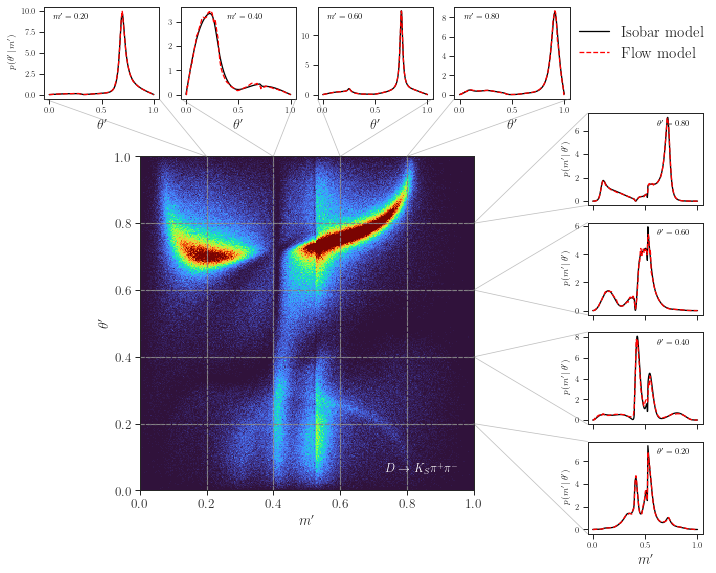

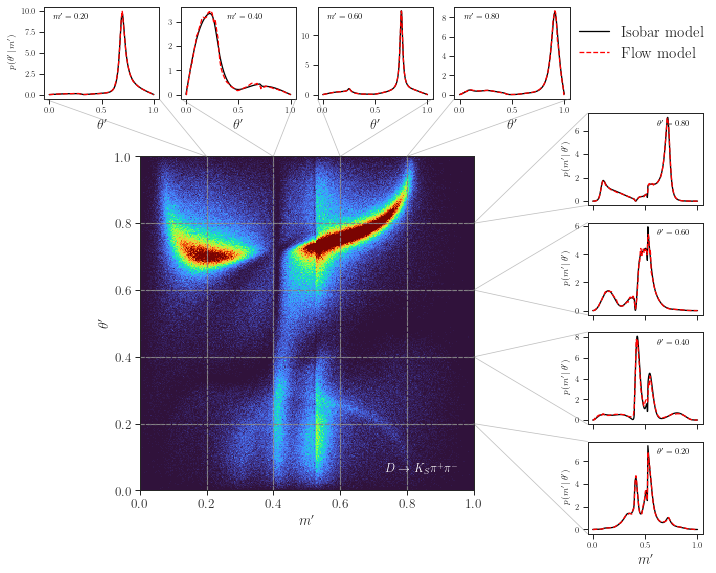

In [33]:
# Composite plot with the main SDP panel plus conditional-probability slices around it
plot_conditionals_around_main(
    exact_samples=mp_thetap,
    flow_samples=mp_thetap_gen,
    flow=flow,
    mprime_slices=mprime_slices,
    theta_slices=theta_slices,
    exact_conditional_theta_given_mprime=exact_conditional_theta_given_mprime,
    exact_conditional_mprime_given_theta=exact_conditional_mprime_given_theta,
    conditional_pdf_func=conditional_pdf_for_helpers,
    sample_label=None,
    savepath=f"{SAVE_PREFIX}_conditionals_around_main.pdf",
)


### Definition of `C(m', theta')`

In this notebook, `C` is the **physical interference term** in Square Dalitz Plot coordinates, not the normalized cosine-like correlation.

We use
$$
\bar A_D(s_{12}, s_{13}) = A_D(s_{13}, s_{12}),
$$
so that
$$
C(s_{12}, s_{13}) = \mathrm{Re}\bigl[A_D(s_{12}, s_{13}) \bar A_D^*(s_{12}, s_{13})\bigr].
$$

With the CP-eigenstate amplitudes
$$
A_{D_{\pm}} = \frac{A_D \pm \bar A_D}{\sqrt{2}},
$$
we have
$$
|A_{D_+}|^2 - |A_{D_-}|^2 = 2 \, \mathrm{Re}(A_D \bar A_D^*) = 2C.
$$

In the SDP convention used here, the plotted quantity is the **differential, Jacobian-weighted** version,
$$
C(m',\theta') = \frac{4 \, \mathrm{Re}(A_D \bar A_D^*)}{\Gamma_+ + \Gamma_-} \, \frac{1}{J_{\mathrm{SDP}}},
$$
which is exactly what is compared against the flow-based extraction
$$
C_{\mathrm{flow}}(m',\theta') = \frac{\Gamma_+ \, p_+(m',\theta') - \Gamma_- \, p_-(m',\theta')}{\Gamma_+ + \Gamma_-}.
$$

Because swapping the two pions sends
$$
(s_{12}, s_{13}) \leftrightarrow (s_{13}, s_{12}),
$$
and in the symmetric SDP convention this is simply
$$
(m', \theta') \to (m', 1-\theta'),
$$
`C` is symmetric under that transformation:
$$
C(m', \theta') = C(m', 1-\theta').
$$


In [ ]:
# C(m', theta') comparison in the symmetric SDP convention

def make_sdp_grid(nx=400, ny=400, eps=1e-6):
    u = np.linspace(eps, 1.0 - eps, nx)
    v = np.linspace(eps, 1.0 - eps, ny)
    U, V = np.meshgrid(u, v, indexing='xy')
    pts = np.column_stack([U.ravel(), V.ravel()])
    return U, V, pts


def compute_Gamma_pm_sym(dkpp_model=dkpp_flavor, sdp_obj=sdp_obj, idx=idx, n_grid=500):
    u = np.linspace(1e-6, 1.0 - 1e-6, n_grid)
    v = np.linspace(1e-6, 1.0 - 1e-6, n_grid)
    U, V = np.meshgrid(u, v, indexing='xy')
    pts = np.column_stack([U.ravel(), V.ravel()])

    dp = sdp_to_dp(pts, sdp_obj, idx)
    s12, s13 = dp[:, 0], dp[:, 1]
    s23 = _sum_m2 - s12 - s13

    A12 = dkpp_model.full(np.column_stack([s12, s13]))
    A13s = dkpp_model.full(np.column_stack([s13, s12]))

    I_plus = np.abs(A12 + A13s) ** 2
    I_minus = np.abs(A12 - A13s) ** 2

    i, j, k = idx
    J = np.array([float(sdp_obj.jacobian(s23[n], s12[n], i, j, k)) for n in range(len(pts))])
    invJ = _finite_pos(1.0 / J)

    dA = (1.0 / (n_grid - 1)) ** 2
    Gamma_plus = np.sum(I_plus * invJ) * dA
    Gamma_minus = np.sum(I_minus * invJ) * dA
    return Gamma_plus, Gamma_minus


@torch.no_grad()
def pdf_from_flow(pts, flow, device=device, batch=65536):
    pts_t = torch.from_numpy(np.asarray(pts, dtype=np.float32)).to(device)
    outs = []
    flow = flow.to(device).eval()
    for i in range(0, len(pts_t), batch):
        outs.append(flow.log_prob(pts_t[i:i + batch]))
    logp = torch.cat(outs, dim=0).cpu().numpy()
    return np.exp(logp)


def compute_C_exact_sym(pts, dkpp_model=dkpp_flavor, sdp_obj=sdp_obj, idx=idx,
                        Gamma_plus=None, Gamma_minus=None):
    if Gamma_plus is None or Gamma_minus is None:
        Gamma_plus, Gamma_minus = compute_Gamma_pm_sym(dkpp_model=dkpp_model, sdp_obj=sdp_obj, idx=idx)

    dp = sdp_to_dp(pts, sdp_obj, idx)
    s12, s13 = dp[:, 0], dp[:, 1]
    s23 = _sum_m2 - s12 - s13
    i, j, k = idx
    J = np.array([float(sdp_obj.jacobian(s23[n], s12[n], i, j, k)) for n in range(len(pts))])
    invJ = _finite_pos(1.0 / J)

    A12 = dkpp_model.full(np.column_stack([s12, s13]))
    A13s = dkpp_model.full(np.column_stack([s13, s12]))
    return 4.0 * np.real(A12 * np.conjugate(A13s)) * invJ / (Gamma_plus + Gamma_minus)


def compute_C_flow_sym(pts, flow_even, flow_odd, Gamma_plus, Gamma_minus, device=device):
    f_even = pdf_from_flow(pts, flow_even, device=device)
    f_odd = pdf_from_flow(pts, flow_odd, device=device)
    return (Gamma_plus * f_even - Gamma_minus * f_odd) / (Gamma_plus + Gamma_minus)


flow_even_C = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
flow_even_C = load_flow_state_compat(flow_even_C, FLOW_CONFIG['even']['ckpt'], map_location=device)
flow_even_C = flow_even_C.to(device).eval()

flow_odd_C = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
flow_odd_C = load_flow_state_compat(flow_odd_C, FLOW_CONFIG['odd']['ckpt'], map_location=device)
flow_odd_C = flow_odd_C.to(device).eval()

Gamma_plus_C, Gamma_minus_C = compute_Gamma_pm_sym()
print(f'Gamma_+ = {Gamma_plus_C:.6f}')
print(f'Gamma_- = {Gamma_minus_C:.6f}')

U_C, V_C, pts_C = make_sdp_grid(nx=400, ny=400)
C_exact = compute_C_exact_sym(pts_C, Gamma_plus=Gamma_plus_C, Gamma_minus=Gamma_minus_C)
C_flow = compute_C_flow_sym(pts_C, flow_even_C, flow_odd_C, Gamma_plus_C, Gamma_minus_C)

NY_C, NX_C = U_C.shape
C_exact_img = C_exact.reshape(NY_C, NX_C)
C_flow_img = C_flow.reshape(NY_C, NX_C)


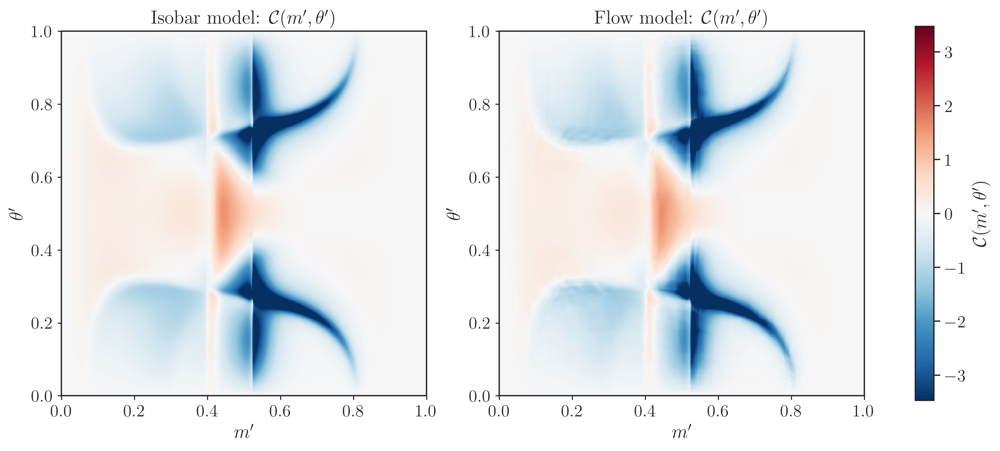

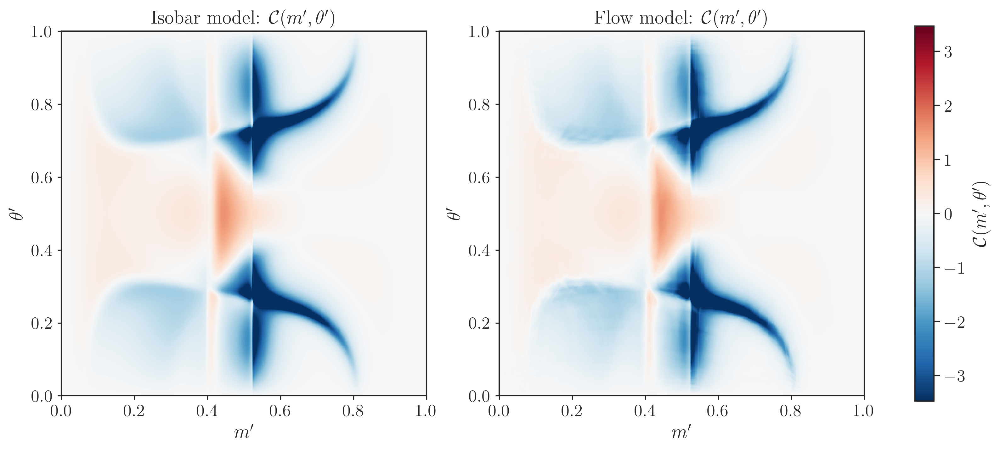

In [35]:
plot_C_comparison_density(
    C_exact=C_exact_img,
    C_flow=C_flow_img,
    extent=(0.0, 1.0, 0.0, 1.0),
    savepath='C_comparison_mtheta_symmetric.pdf',
)


### Definition of `|S(m', theta')|` used here

$$
|S(m',\theta')| = \sqrt{\max\left(0, K(m',\theta')\,\overline{K}(m',\theta') - C(m',\theta')^2\right)}.
$$

Here `K` and `\overline{K}` are the flavor densities at `(m', \theta')` and at the swapped point `(m', 1-\theta')`.
The `max(0, ...)` clipping is applied numerically before taking the square root.


In [36]:
# |S(m', theta')| comparison using |S| = sqrt(K Kbar - C^2)
pts_S = pts_C
pts_S_swap = pts_S.copy()
pts_S_swap[:, 1] = 1.0 - pts_S_swap[:, 1]

K_exact = exact_sdp_density(pts_S, kind='flavor')
Kbar_exact = exact_sdp_density(pts_S_swap, kind='flavor')
absS_exact = np.sqrt(np.clip(K_exact * Kbar_exact - C_exact**2, 0.0, None))

flow_flavor_S = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
flow_flavor_S = load_flow_state_compat(flow_flavor_S, FLOW_CONFIG['flavor']['ckpt'], map_location=device)
flow_flavor_S = flow_flavor_S.to(device).eval()

K_flow = pdf_from_flow(pts_S, flow_flavor_S, device=device)
Kbar_flow = pdf_from_flow(pts_S_swap, flow_flavor_S, device=device)
absS_flow = np.sqrt(np.clip(K_flow * Kbar_flow - C_flow**2, 0.0, None))

NY_S, NX_S = U_C.shape
absS_exact_img = absS_exact.reshape(NY_S, NX_S)
absS_flow_img = absS_flow.reshape(NY_S, NX_S)


Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


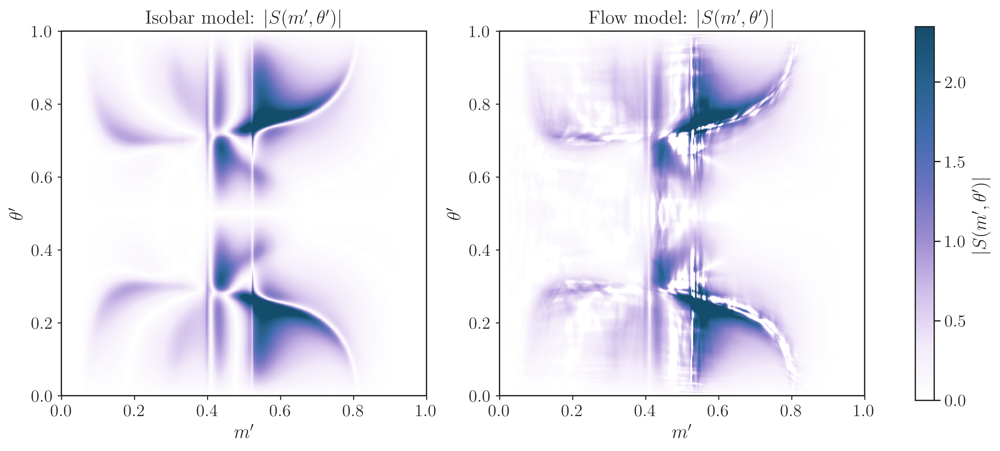

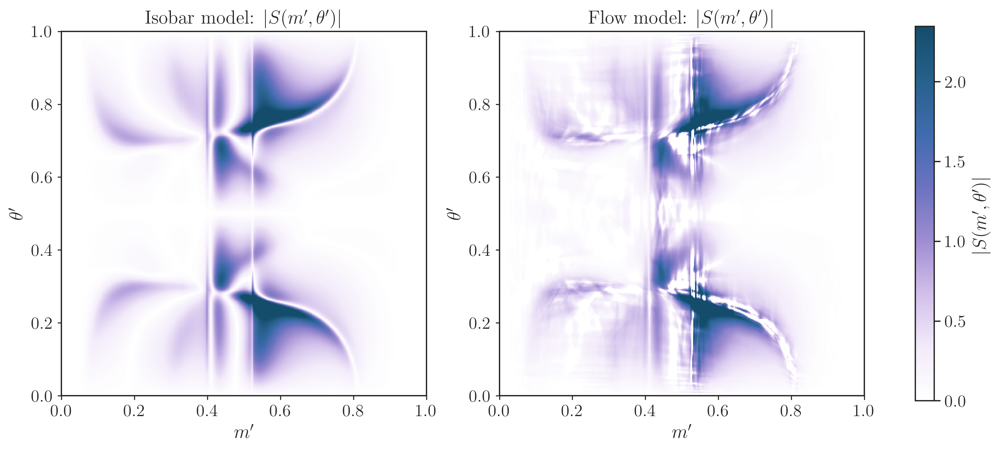

In [37]:
plot_absS_comparison_density(
    S_exact=absS_exact_img,
    S_flow=absS_flow_img,
    extent=(0.0, 1.0, 0.0, 1.0),
    savepath='absS_comparison_mtheta_symmetric.pdf',
)


### Additional plot: raw $S^2(m', \theta')$

This shows the unclipped quantity
$$
S^2(m',\theta') = K(m',\theta')\,\overline{K}(m',\theta') - C(m',\theta')^2,
$$
so negative regions are displayed explicitly instead of being removed by the square root.


In [38]:
# Raw S^2(m', theta') = K Kbar - C^2 comparison
S2_exact = K_exact * Kbar_exact - C_exact**2
S2_flow = K_flow * Kbar_flow - C_flow**2

NY_S2, NX_S2 = U_C.shape
S2_exact_img = S2_exact.reshape(NY_S2, NX_S2)
S2_flow_img = S2_flow.reshape(NY_S2, NX_S2)


In [39]:
import importlib
import symmetric_figure_helpers
importlib.reload(symmetric_figure_helpers)

plot_joint_marginals_density = symmetric_figure_helpers.plot_joint_marginals_density
plot_joint_marginals_samples = symmetric_figure_helpers.plot_joint_marginals_samples
plot_conditionals_around_main = symmetric_figure_helpers.plot_conditionals_around_main
plot_C_comparison_density = symmetric_figure_helpers.plot_C_comparison_density
plot_absS_comparison_density = symmetric_figure_helpers.plot_absS_comparison_density
plot_S2_comparison_density = symmetric_figure_helpers.plot_S2_comparison_density


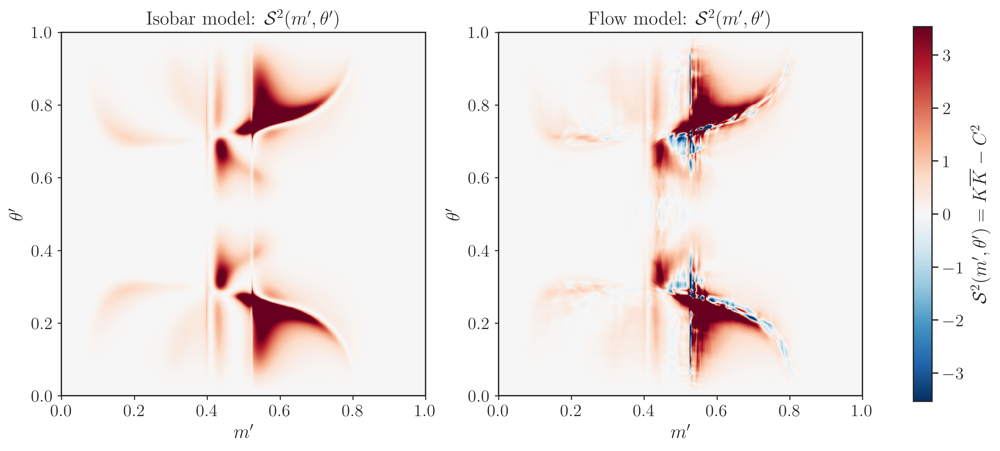

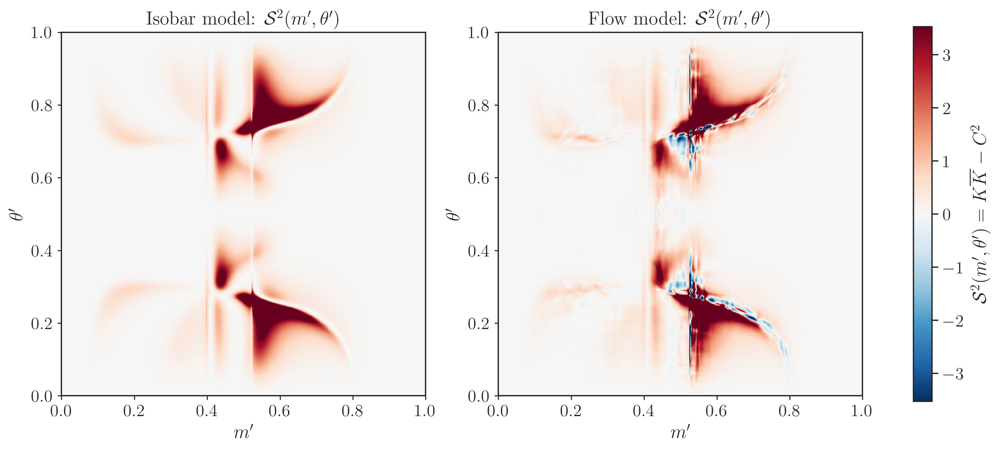

In [40]:
plot_S2_comparison_density(
    S2_exact=S2_exact_img,
    S2_flow=S2_flow_img,
    extent=(0.0, 1.0, 0.0, 1.0),
    savepath='S2_comparison_mtheta_symmetric.pdf',
)


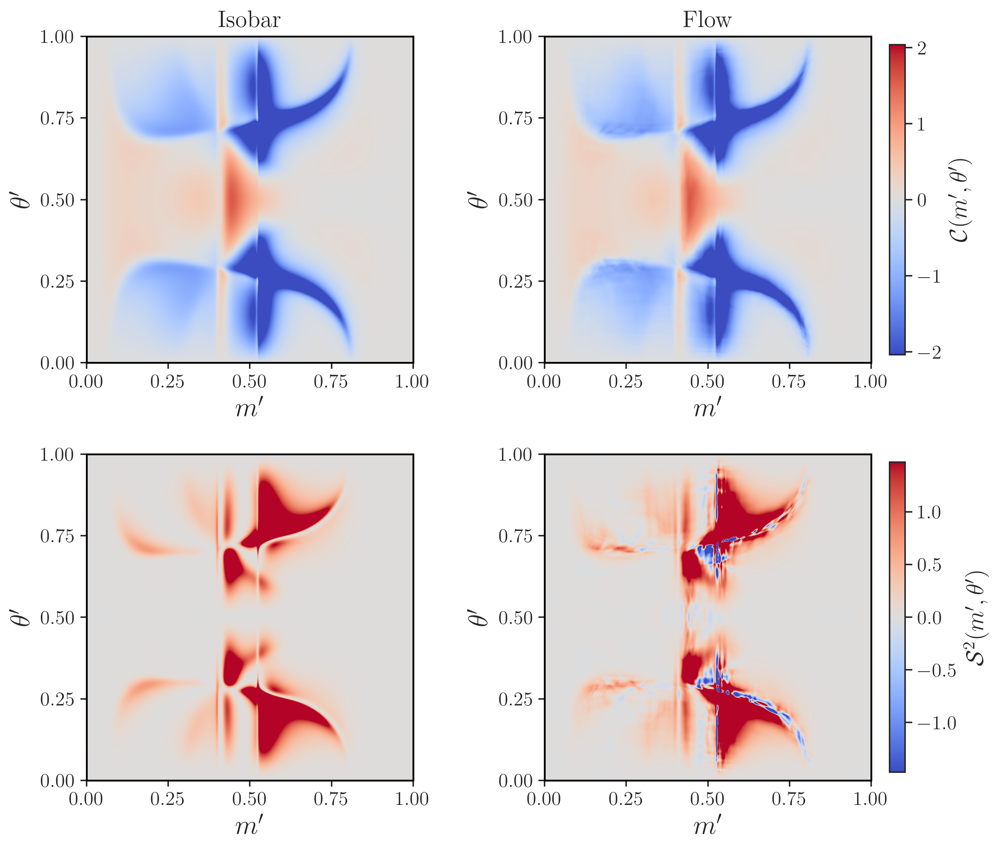

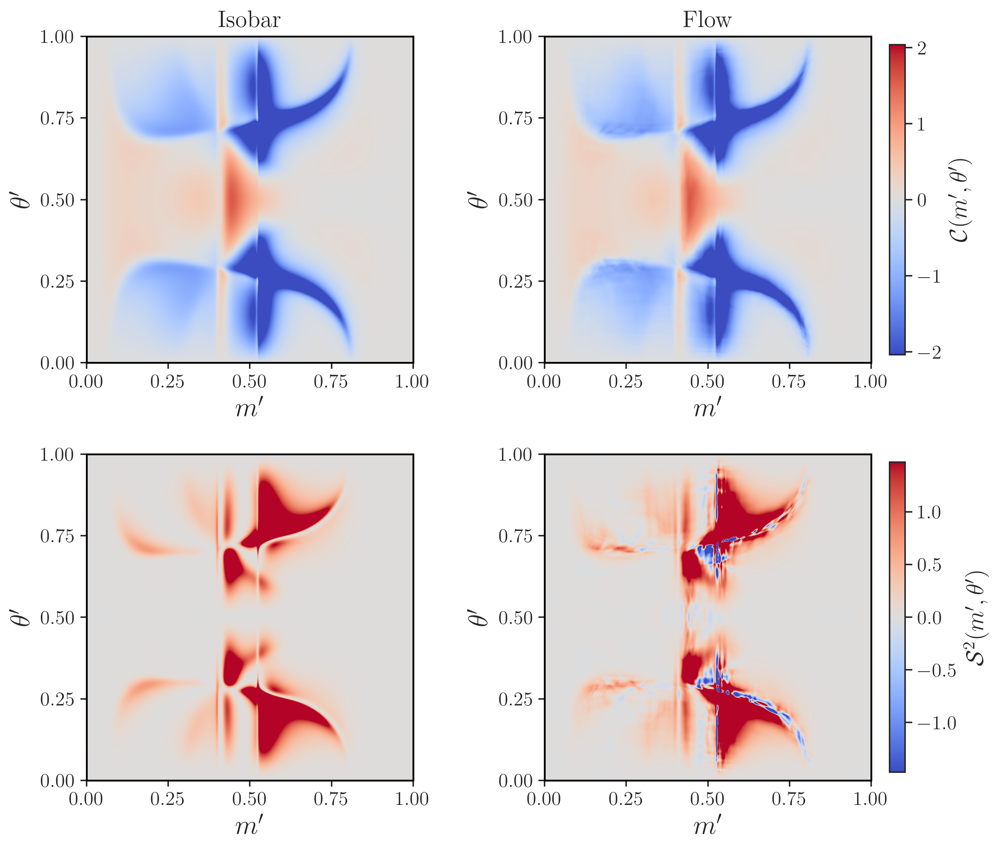

In [41]:
# Combined four-panel figure for C and S^2 (publication-ready)
import importlib
import symmetric_figure_helpers
importlib.reload(symmetric_figure_helpers)

from symmetric_figure_helpers import plot_C_and_S2_combined

plot_C_and_S2_combined(
    C_exact=C_exact_img,
    C_flow=C_flow_img,
    S2_exact=S2_exact_img,
    S2_flow=S2_flow_img,
    extent=(0.0, 1.0, 0.0, 1.0),
    savepath='C_and_S2_combined_symmetric.pdf',
)

## Ensemble Flow Density: Averaging over 25 Seeds

Instead of using a single flow checkpoint (`trial_seed1.pth`), we compute the **pointwise average** density across all 25 trained flows (seeds 0-24). This ensemble average reduces variance from individual training runs and provides a more robust density estimate.

$$
p_{\text{ensemble}}(m', \theta') = \frac{1}{N_{\text{seeds}}} \sum_{i=0}^{24} p_i(m', \theta')
$$

In [18]:
# Ensemble flow density: average over all 25 seeds (seed 0-24)
import warnings
warnings.filterwarnings('ignore', message='Inputs to the softmax are not scaled down')

N_SEEDS = 25
N_ENSEMBLE_GRID = 300  # Grid size for ensemble density

def get_checkpoint_path(kind, seed):
    """Get checkpoint path for a given flow kind and seed."""
    base_dirs = {
        'flavor': 'flavor_SDP_sym_2e6',
        'even': 'even_SDP_sym_2e6',
        'odd': 'odd_SDP_sym_2e6',
    }
    return f"{base_dirs[kind]}/trial_seed{seed}.pth"


@torch.no_grad()
def compute_ensemble_density_grid(kind, n_grid=N_ENSEMBLE_GRID, n_seeds=N_SEEDS,
                                   eps=1e-6, batch=65536, device=None, verbose=True):
    """
    Compute the pointwise average density over an ensemble of flow models.
    Returns the mean density and standard deviation at each grid point.
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    
    # Create grid
    u = np.linspace(eps, 1.0 - eps, n_grid, dtype=np.float32)
    v = np.linspace(eps, 1.0 - eps, n_grid, dtype=np.float32)
    U, V = np.meshgrid(u, v, indexing='xy')
    pts = np.column_stack([U.ravel(), V.ravel()]).astype(np.float32)
    pts_t = torch.from_numpy(pts).to(device)
    
    # Accumulate densities from each seed
    all_densities = []
    
    iterator = tqdm(range(n_seeds), desc=f'Loading {kind} ensemble') if verbose else range(n_seeds)
    
    for seed in iterator:
        ckpt_path = get_checkpoint_path(kind, seed)
        
        # Create and load flow
        flow_i = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
        flow_i = load_flow_state_compat(flow_i, ckpt_path, map_location=device)
        flow_i = flow_i.to(device).eval()
        
        # Compute density
        outs = []
        for i in range(0, len(pts_t), batch):
            outs.append(flow_i.log_prob(pts_t[i:i + batch]))
        logp = torch.cat(outs, dim=0).cpu().numpy()
        density_i = np.exp(logp)
        all_densities.append(density_i)
        
        # Free memory
        del flow_i
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
    
    # Stack and compute statistics
    all_densities = np.stack(all_densities, axis=0)  # (n_seeds, n_grid*n_grid)
    mean_density = np.mean(all_densities, axis=0)
    std_density = np.std(all_densities, axis=0)
    
    return u, v, mean_density.reshape(len(v), len(u)), std_density.reshape(len(v), len(u))

In [44]:
# Compute ensemble average density for flavor flow
print(f"Computing ensemble density for {FLOW_KIND} flow (averaging {N_SEEDS} seeds)...")
mprime_ens, theta_ens, dens_ensemble_2d, dens_ensemble_std = compute_ensemble_density_grid(
    FLOW_KIND, n_grid=N_ENSEMBLE_GRID, n_seeds=N_SEEDS, device=device, verbose=True
)
print(f"Ensemble density computed on {N_ENSEMBLE_GRID}x{N_ENSEMBLE_GRID} grid")

Computing ensemble density for flavor flow (averaging 25 seeds)...


Loading flavor ensemble:   0%|          | 0/25 [00:00<?, ?it/s]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:   4%|▍         | 1/25 [00:01<00:46,  1.94s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:   8%|▊         | 2/25 [00:03<00:41,  1.81s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  12%|█▏        | 3/25 [00:05<00:40,  1.83s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  16%|█▌        | 4/25 [00:06<00:35,  1.69s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  20%|██        | 5/25 [00:08<00:30,  1.50s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  24%|██▍       | 6/25 [00:09<00:27,  1.46s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  28%|██▊       | 7/25 [00:11<00:31,  1.74s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  32%|███▏      | 8/25 [00:13<00:28,  1.70s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  36%|███▌      | 9/25 [00:15<00:27,  1.71s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  40%|████      | 10/25 [00:16<00:24,  1.64s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  44%|████▍     | 11/25 [00:18<00:25,  1.83s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  48%|████▊     | 12/25 [00:21<00:25,  1.98s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  52%|█████▏    | 13/25 [00:23<00:24,  2.07s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  56%|█████▌    | 14/25 [00:26<00:24,  2.19s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  60%|██████    | 15/25 [00:28<00:22,  2.23s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  64%|██████▍   | 16/25 [00:30<00:19,  2.20s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  68%|██████▊   | 17/25 [00:32<00:18,  2.29s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  72%|███████▏  | 18/25 [00:35<00:16,  2.29s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  76%|███████▌  | 19/25 [00:36<00:12,  2.10s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  80%|████████  | 20/25 [00:38<00:10,  2.02s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  84%|████████▍ | 21/25 [00:40<00:07,  1.94s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  88%|████████▊ | 22/25 [00:42<00:06,  2.03s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  92%|█████████▏| 23/25 [00:44<00:03,  1.87s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble:  96%|█████████▌| 24/25 [00:46<00:01,  1.84s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading flavor ensemble: 100%|██████████| 25/25 [00:47<00:00,  1.91s/it]

Ensemble density computed on 300x300 grid


In [19]:
# Compute exact density on the same grid for comparison
mprime_exact_ens, theta_exact_ens, dens_exact_ens_2d = exact_density_grid(FLOW_KIND, n_grid=N_ENSEMBLE_GRID)

# Compute marginals
dens_m_exact_ens = np.trapz(dens_exact_ens_2d, theta_exact_ens, axis=0)
dens_theta_exact_ens = np.trapz(dens_exact_ens_2d, mprime_exact_ens, axis=1)

dens_m_ensemble = np.trapz(dens_ensemble_2d, theta_ens, axis=0)
dens_theta_ensemble = np.trapz(dens_ensemble_2d, mprime_ens, axis=1)

NameError: name 'dens_ensemble_2d' is not defined

/var/folders/k9/p5b9wydx1kn33thc8p74blx40000gn/T/ipykernel_48455/2524812947.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


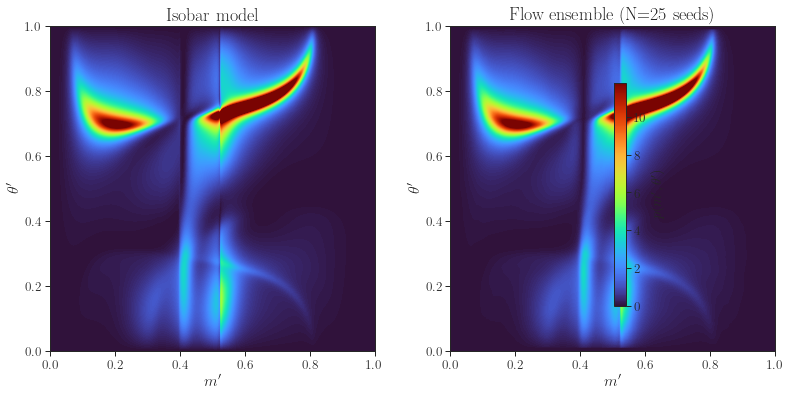

In [46]:
# Side-by-side comparison: Isobar (exact) vs Ensemble Flow
fig, axes = plt.subplots(1, 2, figsize=(11, 5))

# Common color scale
ref = np.concatenate([dens_exact_ens_2d.ravel(), dens_ensemble_2d.ravel()])
vmax = np.nanpercentile(ref, 99)
extent = [0.0, 1.0, 0.0, 1.0]

# Left: Exact (Isobar)
im1 = axes[0].imshow(
    dens_exact_ens_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax, aspect='equal', interpolation='bilinear'
)
axes[0].set_title('Isobar model', fontsize=18)
axes[0].set_xlabel(r"$m'$", fontsize=16)
axes[0].set_ylabel(r"$\theta'$", fontsize=16)

# Right: Ensemble Flow
im2 = axes[1].imshow(
    dens_ensemble_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax, aspect='equal', interpolation='bilinear'
)
axes[1].set_title(f'Flow ensemble (N={N_SEEDS} seeds)', fontsize=18)
axes[1].set_xlabel(r"$m'$", fontsize=16)
axes[1].set_ylabel(r"$\theta'$", fontsize=16)

# Shared colorbar
fig.colorbar(im2, ax=axes, shrink=0.82, label=r'$p(m^\prime, \theta^\prime)$')
fig.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_density_comparison.pdf', dpi=300, bbox_inches='tight')
plt.show()

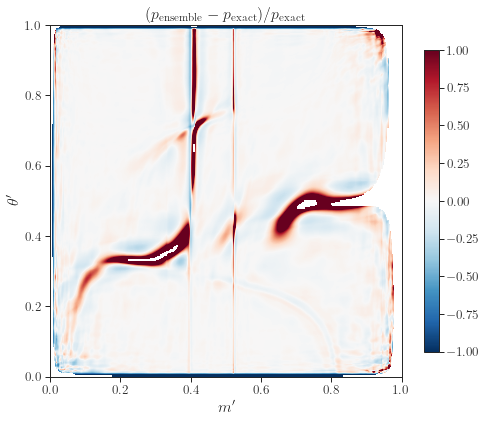

Mean absolute fractional difference: 0.1621
Max absolute fractional difference: 160.9719


In [47]:
# Fractional difference: (Ensemble - Exact) / Exact
fig, ax = plt.subplots(figsize=(7, 6))

frac_diff_ens = np.full_like(dens_exact_ens_2d, np.nan)
mask = dens_exact_ens_2d > np.nanpercentile(dens_exact_ens_2d[dens_exact_ens_2d > 0], 5)
frac_diff_ens[mask] = (dens_ensemble_2d[mask] - dens_exact_ens_2d[mask]) / dens_exact_ens_2d[mask]

vlim = np.nanpercentile(np.abs(frac_diff_ens[mask]), 98)
im = ax.imshow(
    frac_diff_ens, origin='lower', extent=[0, 1, 0, 1],
    cmap='RdBu_r', vmin=-vlim, vmax=vlim, aspect='equal', interpolation='bilinear'
)
ax.set_xlabel(r"$m'$", fontsize=16)
ax.set_ylabel(r"$\theta'$", fontsize=16)
ax.set_title(r'$(p_{\mathrm{ensemble}} - p_{\mathrm{exact}}) / p_{\mathrm{exact}}$', fontsize=16)
fig.colorbar(im, ax=ax, shrink=0.82)
fig.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_fractional_diff.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"Mean absolute fractional difference: {np.nanmean(np.abs(frac_diff_ens[mask])):.4f}")
print(f"Max absolute fractional difference: {np.nanmax(np.abs(frac_diff_ens[mask])):.4f}")

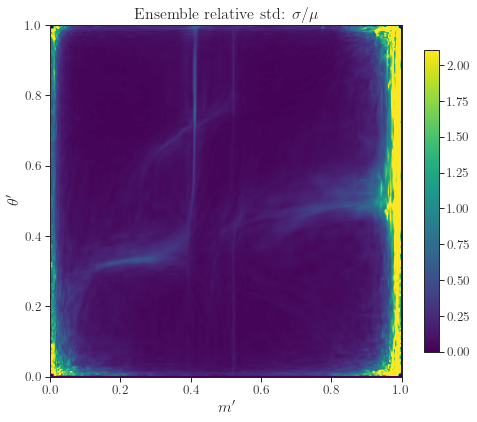

Mean relative std: 0.2267
Max relative std: 4.8433


In [48]:
# Ensemble standard deviation (uncertainty) map
fig, ax = plt.subplots(figsize=(7, 6))

# Relative std: std / mean
rel_std = np.zeros_like(dens_ensemble_std)
nonzero = dens_ensemble_2d > 1e-10
rel_std[nonzero] = dens_ensemble_std[nonzero] / dens_ensemble_2d[nonzero]

im = ax.imshow(
    rel_std, origin='lower', extent=[0, 1, 0, 1],
    cmap='viridis', vmin=0, vmax=np.nanpercentile(rel_std, 98),
    aspect='equal', interpolation='bilinear'
)
ax.set_xlabel(r"$m'$", fontsize=16)
ax.set_ylabel(r"$\theta'$", fontsize=16)
ax.set_title(r'Ensemble relative std: $\sigma / \mu$', fontsize=16)
fig.colorbar(im, ax=ax, shrink=0.82)
fig.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_relative_std.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"Mean relative std: {np.nanmean(rel_std[nonzero]):.4f}")
print(f"Max relative std: {np.nanmax(rel_std[nonzero]):.4f}")

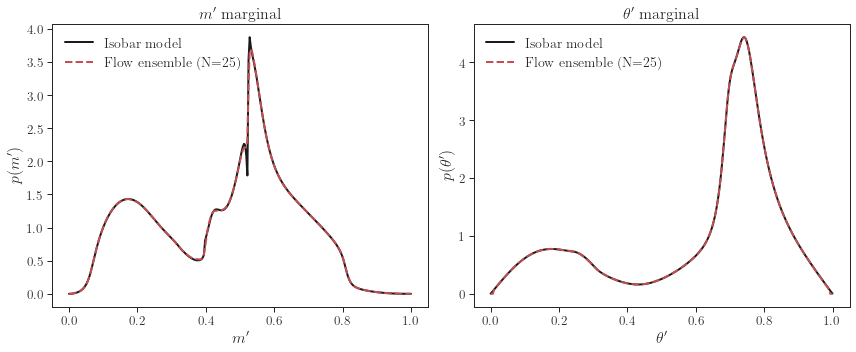

In [49]:
# Marginal comparison: Exact vs Ensemble
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# m' marginal
axes[0].plot(mprime_exact_ens, dens_m_exact_ens, 'k-', lw=2, label='Isobar model')
axes[0].plot(mprime_ens, dens_m_ensemble, 'r--', lw=2, label=f'Flow ensemble (N={N_SEEDS})')
axes[0].set_xlabel(r"$m'$", fontsize=16)
axes[0].set_ylabel(r"$p(m')$", fontsize=16)
axes[0].legend(frameon=False, fontsize=14)
axes[0].set_title(r"$m'$ marginal", fontsize=16)

# theta' marginal
axes[1].plot(theta_exact_ens, dens_theta_exact_ens, 'k-', lw=2, label='Isobar model')
axes[1].plot(theta_ens, dens_theta_ensemble, 'r--', lw=2, label=f'Flow ensemble (N={N_SEEDS})')
axes[1].set_xlabel(r"$\theta'$", fontsize=16)
axes[1].set_ylabel(r"$p(\theta')$", fontsize=16)
axes[1].legend(frameon=False, fontsize=14)
axes[1].set_title(r"$\theta'$ marginal", fontsize=16)

fig.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_marginals.pdf', dpi=300, bbox_inches='tight')
plt.show()

## Pointwise Coverage

We compute the **Z-score (pull)** at each point in the Dalitz plane:

$$
Z(m', \theta') = \frac{p_{\mathrm{isobar}} - p_{\mathrm{ens}}}{\sigma_{\mathrm{ens}}}
$$

If the ensemble is well-calibrated, $Z$ should be distributed as $\mathcal{N}(0, 1)$.

In [9]:
# Compute Z-score (pull) map: Z = (p_isobar - p_ens) / sigma_ens

Z_map = np.full_like(dens_exact_ens_2d, np.nan)
valid_mask = dens_ensemble_std > 1e-15
Z_map[valid_mask] = (dens_exact_ens_2d[valid_mask] - dens_ensemble_2d[valid_mask]) / dens_ensemble_std[valid_mask]

print(f"Valid points for Z-score: {np.sum(valid_mask):,} / {Z_map.size:,}")
print(f"Z-score range: [{np.nanmin(Z_map):.2f}, {np.nanmax(Z_map):.2f}]")
print(f"Z-score mean: {np.nanmean(Z_map):.3f}, std: {np.nanstd(Z_map):.3f}")

NameError: name 'dens_exact_ens_2d' is not defined

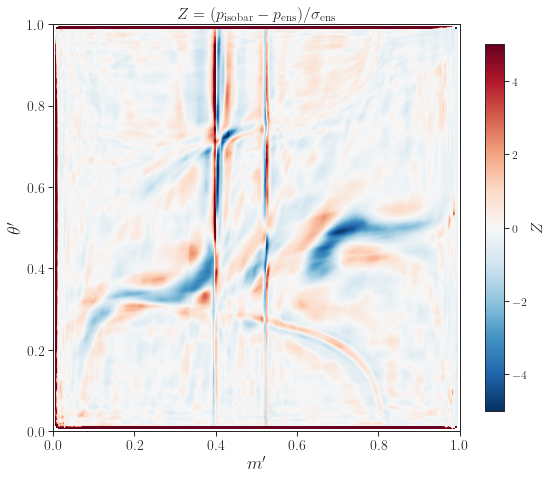


Coverage statistics:
  Within 1σ: 89.2% (expected: 68.3%)
  Within 2σ: 94.9% (expected: 95.0%)
  Within 3σ: 97.0% (expected: 99.7%)


In [57]:
# Pointwise coverage: Z-score heatmap
from matplotlib.colors import TwoSlopeNorm

fig, ax = plt.subplots(figsize=(8, 7))

# Symmetric colorbar centered at 0
z_limit = min(5, np.nanpercentile(np.abs(Z_map[valid_mask]), 99))
norm = TwoSlopeNorm(vcenter=0, vmin=-z_limit, vmax=z_limit)

im = ax.imshow(
    Z_map, origin='lower', extent=[0, 1, 0, 1],
    cmap='RdBu_r', norm=norm, aspect='equal', interpolation='bilinear'
)
ax.set_xlabel(r"$m'$", fontsize=18)
ax.set_ylabel(r"$\theta'$", fontsize=18)
ax.set_title(r'$Z = (p_{\mathrm{isobar}} - p_{\mathrm{ens}}) / \sigma_{\mathrm{ens}}$', fontsize=16)
ax.tick_params(labelsize=14)

cbar = fig.colorbar(im, ax=ax, shrink=0.82)
cbar.set_label(r'$Z$', fontsize=16)
cbar.ax.tick_params(labelsize=12)

fig.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_zscore_map.pdf', dpi=300, bbox_inches='tight')
plt.show()

# Print coverage statistics
Z_valid = Z_map[valid_mask]
frac_1sigma = np.mean(np.abs(Z_valid) < 1.0) * 100
frac_2sigma = np.mean(np.abs(Z_valid) < 1.96) * 100
frac_3sigma = np.mean(np.abs(Z_valid) < 3.0) * 100
print(f"\nCoverage statistics:")
print(f"  Within 1σ: {frac_1sigma:.1f}% (expected: 68.3%)")
print(f"  Within 2σ: {frac_2sigma:.1f}% (expected: 95.0%)")
print(f"  Within 3σ: {frac_3sigma:.1f}% (expected: 99.7%)")

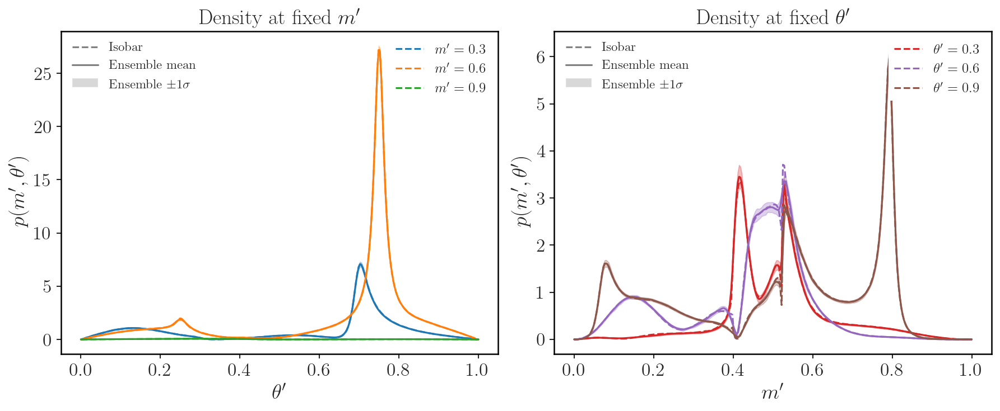


Saved: draft_figures_symmetric_flavor_ensemble_slices.pdf


In [141]:
# Separate figure: Slice plots at fixed m' and θ'
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

fig, (ax_slice_m, ax_slice_theta) = plt.subplots(1, 2, figsize=(12, 5), dpi=150)

# Left panel: Slices at fixed m' values
m_slice_values = [0.3, 0.6, 0.9]
colors_m = ['#1f77b4', '#ff7f0e', '#2ca02c']

for i, m_val in enumerate(m_slice_values):
    idx_m = np.argmin(np.abs(mprime_ens - m_val))
    
    slice_isobar = dens_exact_ens_2d[:, idx_m]
    slice_ensemble = dens_ensemble_2d[:, idx_m]
    slice_std = dens_ensemble_std[:, idx_m]
    
    # Plot ensemble with 1σ band first (behind)
    ax_slice_m.fill_between(theta_ens, slice_ensemble - slice_std, slice_ensemble + slice_std,
                            color=colors_m[i], alpha=0.3)
    # Plot ensemble mean (solid line)
    ax_slice_m.plot(theta_ens, slice_ensemble, color=colors_m[i], lw=1.5, ls='-')
    # Plot isobar (dashed line) on top
    ax_slice_m.plot(theta_ens, slice_isobar, color=colors_m[i], lw=1.5, ls='--',
                    label=rf"$m'={m_val}$")

ax_slice_m.set_xlabel(r"$\theta'$", fontsize=18)
ax_slice_m.set_ylabel(r"$p(m', \theta')$", fontsize=18)
ax_slice_m.set_title(r"Density at fixed $m'$", fontsize=18)

# Slice value legend (upper right)
slice_legend_m = ax_slice_m.legend(loc='upper right', fontsize=12, frameon=True, 
                                    facecolor='white', edgecolor='none', framealpha=0.9)
ax_slice_m.add_artist(slice_legend_m)

# Style legend (upper left)
style_handles = [
    Line2D([0], [0], color='gray', lw=1.5, ls='--', label='Isobar'),
    Line2D([0], [0], color='gray', lw=1.5, ls='-', label='Ensemble mean'),
    Patch(facecolor='gray', alpha=0.3, label=r'Ensemble $\pm 1\sigma$'),
]
ax_slice_m.legend(handles=style_handles, loc='upper left', fontsize=11, frameon=True,
                  facecolor='white', edgecolor='none', framealpha=0.9)
ax_slice_m.add_artist(slice_legend_m)

# Right panel: Slices at fixed θ' values
theta_slice_values = [0.3, 0.6, 0.9]
colors_theta = ['#d62728', '#9467bd', '#8c564b']

for i, theta_val in enumerate(theta_slice_values):
    idx_theta = np.argmin(np.abs(theta_ens - theta_val))
    
    slice_isobar = dens_exact_ens_2d[idx_theta, :]
    slice_ensemble = dens_ensemble_2d[idx_theta, :]
    slice_std = dens_ensemble_std[idx_theta, :]
    
    # Plot ensemble with 1σ band first (behind)
    ax_slice_theta.fill_between(mprime_ens, slice_ensemble - slice_std, slice_ensemble + slice_std,
                                color=colors_theta[i], alpha=0.3)
    # Plot ensemble mean (solid line)
    ax_slice_theta.plot(mprime_ens, slice_ensemble, color=colors_theta[i], lw=1.5, ls='-')
    # Plot isobar (dashed line) on top
    ax_slice_theta.plot(mprime_ens, slice_isobar, color=colors_theta[i], lw=1.5, ls='--',
                        label=rf"$\theta'={theta_val}$")

ax_slice_theta.set_xlabel(r"$m'$", fontsize=18)
ax_slice_theta.set_ylabel(r"$p(m', \theta')$", fontsize=18)
ax_slice_theta.set_title(r"Density at fixed $\theta'$", fontsize=18)

# Slice value legend (upper right)
slice_legend_theta = ax_slice_theta.legend(loc='upper right', fontsize=12, frameon=True, 
                                            facecolor='white', edgecolor='none', framealpha=0.9)
ax_slice_theta.add_artist(slice_legend_theta)

# Style legend (upper left)
ax_slice_theta.legend(handles=style_handles, loc='upper left', fontsize=11, frameon=True,
                      facecolor='white', edgecolor='none', framealpha=0.9)
ax_slice_theta.add_artist(slice_legend_theta)

# Style both axes
for ax in (ax_slice_m, ax_slice_theta):
    ax.tick_params(direction="out", length=4, width=1.0, labelsize=16)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
        spine.set_color("black")

plt.tight_layout()
fig.savefig(f'{SAVE_PREFIX}_ensemble_slices.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: {SAVE_PREFIX}_ensemble_slices.pdf")

In [26]:
# Four-panel figure: CP-even and CP-odd densities (Isobar vs Flow ensemble)
# Compute ensemble densities for even and odd flows

print("Computing ensemble density for CP-even flow...")
mprime_even, theta_even, dens_even_flow_2d, dens_even_flow_std = compute_ensemble_density_grid(
    'even', n_grid=N_ENSEMBLE_GRID, n_seeds=N_SEEDS, device=device, verbose=True
)
mprime_even_exact, theta_even_exact, dens_even_exact_2d = exact_density_grid('even', n_grid=N_ENSEMBLE_GRID)

print("\nComputing ensemble density for CP-odd flow...")
mprime_odd, theta_odd, dens_odd_flow_2d, dens_odd_flow_std = compute_ensemble_density_grid(
    'odd', n_grid=N_ENSEMBLE_GRID, n_seeds=N_SEEDS, device=device, verbose=True
)
mprime_odd_exact, theta_odd_exact, dens_odd_exact_2d = exact_density_grid('odd', n_grid=N_ENSEMBLE_GRID)

print("\nDone computing CP-even and CP-odd ensemble densities.")

Computing ensemble density for CP-even flow...


Loading even ensemble:   0%|          | 0/25 [00:00<?, ?it/s]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:   4%|▍         | 1/25 [00:01<00:41,  1.75s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:   8%|▊         | 2/25 [00:02<00:33,  1.45s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  12%|█▏        | 3/25 [00:04<00:33,  1.52s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  16%|█▌        | 4/25 [00:06<00:32,  1.56s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  20%|██        | 5/25 [00:07<00:30,  1.52s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  24%|██▍       | 6/25 [00:09<00:28,  1.48s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  28%|██▊       | 7/25 [00:10<00:26,  1.49s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  32%|███▏      | 8/25 [00:12<00:28,  1.66s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  36%|███▌      | 9/25 [00:14<00:29,  1.86s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  40%|████      | 10/25 [00:16<00:27,  1.86s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  44%|████▍     | 11/25 [00:18<00:24,  1.74s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  48%|████▊     | 12/25 [00:19<00:20,  1.58s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  52%|█████▏    | 13/25 [00:21<00:20,  1.72s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  56%|█████▌    | 14/25 [00:22<00:17,  1.62s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  60%|██████    | 15/25 [00:24<00:14,  1.50s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  64%|██████▍   | 16/25 [00:25<00:12,  1.41s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  68%|██████▊   | 17/25 [00:26<00:11,  1.41s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  72%|███████▏  | 18/25 [00:28<00:10,  1.49s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  76%|███████▌  | 19/25 [00:29<00:08,  1.47s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  80%|████████  | 20/25 [00:30<00:06,  1.39s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  84%|████████▍ | 21/25 [00:32<00:05,  1.33s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  88%|████████▊ | 22/25 [00:33<00:04,  1.36s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  92%|█████████▏| 23/25 [00:34<00:02,  1.34s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble:  96%|█████████▌| 24/25 [00:36<00:01,  1.43s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading even ensemble: 100%|██████████| 25/25 [00:37<00:00,  1.52s/it]



Computing ensemble density for CP-odd flow...


Loading odd ensemble:   0%|          | 0/25 [00:00<?, ?it/s]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:   4%|▍         | 1/25 [00:01<00:33,  1.40s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:   8%|▊         | 2/25 [00:02<00:33,  1.45s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  12%|█▏        | 3/25 [00:04<00:33,  1.50s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  16%|█▌        | 4/25 [00:05<00:31,  1.52s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  20%|██        | 5/25 [00:07<00:31,  1.56s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  24%|██▍       | 6/25 [00:09<00:29,  1.56s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  28%|██▊       | 7/25 [00:10<00:27,  1.53s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  32%|███▏      | 8/25 [00:11<00:24,  1.46s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  36%|███▌      | 9/25 [00:13<00:23,  1.49s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  40%|████      | 10/25 [00:14<00:22,  1.48s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  44%|████▍     | 11/25 [00:16<00:21,  1.55s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  48%|████▊     | 12/25 [00:18<00:19,  1.50s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  52%|█████▏    | 13/25 [00:19<00:18,  1.50s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  56%|█████▌    | 14/25 [00:20<00:15,  1.45s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  60%|██████    | 15/25 [00:22<00:14,  1.47s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  64%|██████▍   | 16/25 [00:23<00:13,  1.46s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  68%|██████▊   | 17/25 [00:25<00:11,  1.41s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  72%|███████▏  | 18/25 [00:26<00:10,  1.43s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  76%|███████▌  | 19/25 [00:28<00:08,  1.42s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  80%|████████  | 20/25 [00:29<00:06,  1.38s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  84%|████████▍ | 21/25 [00:30<00:05,  1.33s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  88%|████████▊ | 22/25 [00:31<00:03,  1.32s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  92%|█████████▏| 23/25 [00:33<00:02,  1.49s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble:  96%|█████████▌| 24/25 [00:35<00:01,  1.48s/it]

Applied checkpoint compatibility fix:
  filled missing keys: ['_transform._transforms.0._transform.temperature']


Loading odd ensemble: 100%|██████████| 25/25 [00:36<00:00,  1.46s/it]



Done computing CP-even and CP-odd ensemble densities.


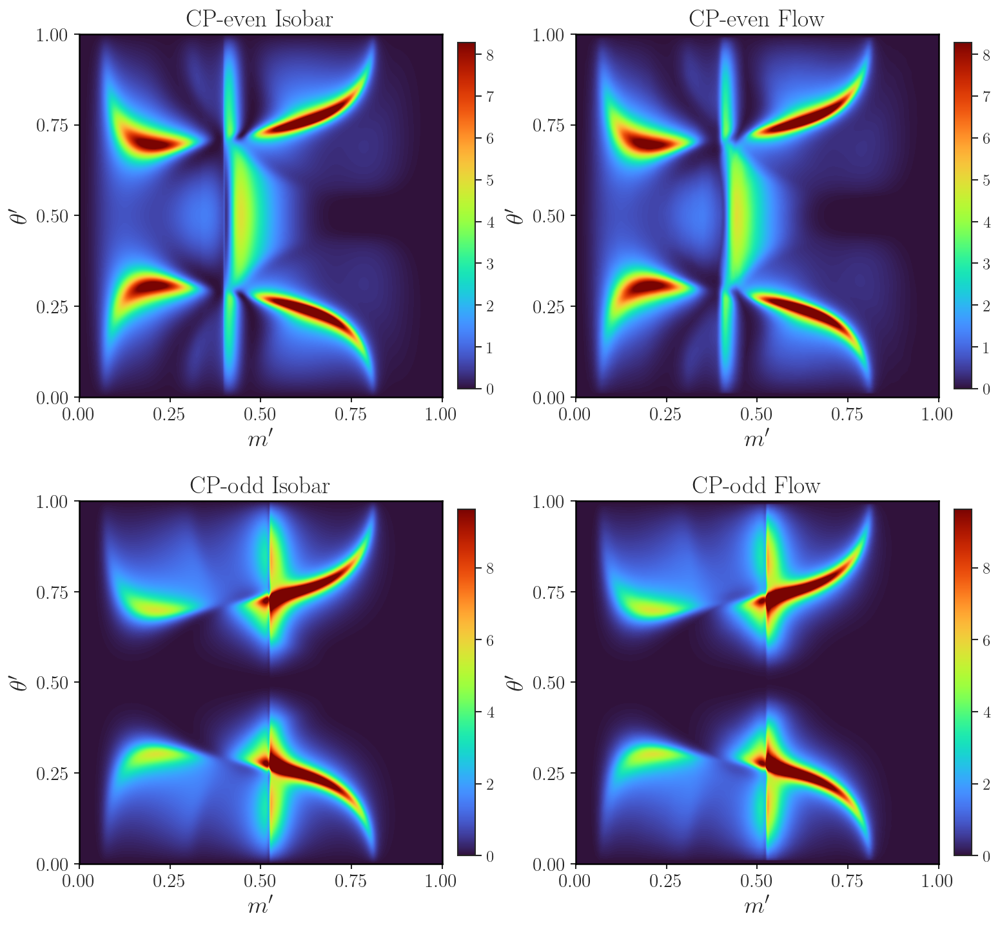


Saved: draft_figures_symmetric_flavor_cp_even_odd_4panel.pdf


In [27]:
# Four-panel figure: CP-even and CP-odd (Isobar vs Flow)
fig = plt.figure(figsize=(11, 10), dpi=150)
gs = fig.add_gridspec(
    2, 2,
    width_ratios=[1, 1],
    height_ratios=[1, 1],
    wspace=0.25,
    hspace=0.28,
    left=0.08,
    right=0.92,
    top=0.94,
    bottom=0.08,
)

ax_even_iso = fig.add_subplot(gs[0, 0])
ax_even_flow = fig.add_subplot(gs[0, 1])
ax_odd_iso = fig.add_subplot(gs[1, 0])
ax_odd_flow = fig.add_subplot(gs[1, 1])

extent = [0.0, 1.0, 0.0, 1.0]
tick_locs = [0.0, 0.25, 0.5, 0.75, 1.0]

# Common color scale for CP-even
ref_even = np.concatenate([dens_even_exact_2d.ravel(), dens_even_flow_2d.ravel()])
vmax_even = np.nanpercentile(ref_even, 99)

# Common color scale for CP-odd
ref_odd = np.concatenate([dens_odd_exact_2d.ravel(), dens_odd_flow_2d.ravel()])
vmax_odd = np.nanpercentile(ref_odd, 99)

# Panel (a): CP-even Isobar
im_even_iso = ax_even_iso.imshow(
    dens_even_exact_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_even, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_even_iso.set_title('CP-even Isobar', fontsize=18)
ax_even_iso.set_xticks(tick_locs)
ax_even_iso.set_yticks(tick_locs)
ax_even_iso.set_xlabel(r"$m'$", fontsize=18)
ax_even_iso.set_ylabel(r"$\theta'$", fontsize=18)

cbar_even_iso = fig.colorbar(im_even_iso, ax=ax_even_iso, location='right',
                              fraction=0.046, pad=0.04, shrink=0.95)
cbar_even_iso.ax.tick_params(labelsize=12)

# Panel (b): CP-even Flow
im_even_flow = ax_even_flow.imshow(
    dens_even_flow_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_even, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_even_flow.set_title('CP-even Flow', fontsize=18)
ax_even_flow.set_xticks(tick_locs)
ax_even_flow.set_yticks(tick_locs)
ax_even_flow.set_xlabel(r"$m'$", fontsize=18)
ax_even_flow.set_ylabel(r"$\theta'$", fontsize=18)

cbar_even_flow = fig.colorbar(im_even_flow, ax=ax_even_flow, location='right',
                               fraction=0.046, pad=0.04, shrink=0.95)
cbar_even_flow.ax.tick_params(labelsize=12)

# Panel (c): CP-odd Isobar
im_odd_iso = ax_odd_iso.imshow(
    dens_odd_exact_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_odd, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_odd_iso.set_title('CP-odd Isobar', fontsize=18)
ax_odd_iso.set_xticks(tick_locs)
ax_odd_iso.set_yticks(tick_locs)
ax_odd_iso.set_xlabel(r"$m'$", fontsize=18)
ax_odd_iso.set_ylabel(r"$\theta'$", fontsize=18)

cbar_odd_iso = fig.colorbar(im_odd_iso, ax=ax_odd_iso, location='right',
                             fraction=0.046, pad=0.04, shrink=0.95)
cbar_odd_iso.ax.tick_params(labelsize=12)

# Panel (d): CP-odd Flow
im_odd_flow = ax_odd_flow.imshow(
    dens_odd_flow_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_odd, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_odd_flow.set_title('CP-odd Flow', fontsize=18)
ax_odd_flow.set_xticks(tick_locs)
ax_odd_flow.set_yticks(tick_locs)
ax_odd_flow.set_xlabel(r"$m'$", fontsize=18)
ax_odd_flow.set_ylabel(r"$\theta'$", fontsize=18)

cbar_odd_flow = fig.colorbar(im_odd_flow, ax=ax_odd_flow, location='right',
                              fraction=0.046, pad=0.04, shrink=0.95)
cbar_odd_flow.ax.tick_params(labelsize=12)

# Style all axes
for ax in (ax_even_iso, ax_even_flow, ax_odd_iso, ax_odd_flow):
    ax.tick_params(direction="out", length=4, width=1.0, labelsize=14)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
        spine.set_color("black")

fig.savefig(f'{SAVE_PREFIX}_cp_even_odd_4panel.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: {SAVE_PREFIX}_cp_even_odd_4panel.pdf")

In [ ]:
# ============================================================================
# Load CP-even training data and compute ensemble coverage at data points
# ============================================================================
even_data_pts = np.load('representative data/dataset_001_even.npy')
print(f'Loaded CP-even training data: {len(even_data_pts):,} points')

# Evaluate exact (isobar) density at training points
print('Evaluating CP-even isobar density at training points...')
rho_iso_even = exact_sdp_density(even_data_pts, kind='even')

# Evaluate ensemble flow density (mean + std) at training points
print('Evaluating CP-even ensemble flow density at training points...')
pts_f32_even = even_data_pts.astype(np.float32)
pts_t_even = torch.from_numpy(pts_f32_even).to(device)

all_dens_even = []
for seed in tqdm(range(N_SEEDS), desc='Ensemble at even training pts'):
    ckpt_path = get_checkpoint_path('even', seed)
    flow_i = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
    flow_i = load_flow_state_compat(flow_i, ckpt_path, map_location=device)
    flow_i = flow_i.to(device).eval()
    
    outs = []
    batch = 65536
    for i in range(0, len(pts_t_even), batch):
        with torch.no_grad():
            outs.append(flow_i.log_prob(pts_t_even[i:i + batch]))
    logp = torch.cat(outs, dim=0).detach().cpu().numpy()
    all_dens_even.append(np.exp(logp))
    
    del flow_i
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

all_dens_even = np.stack(all_dens_even, axis=0)
rho_mean_even = np.mean(all_dens_even, axis=0)
sigma_ens_even = np.std(all_dens_even, axis=0)

# Coverage classification
valid_even = sigma_ens_even > 1e-15
residual_even = np.abs(rho_iso_even[valid_even] - rho_mean_even[valid_even])
exceeds_1sigma_even = residual_even > sigma_ens_even[valid_even]
f_cov_even = np.mean(~exceeds_1sigma_even)

print(f'\nCP-even results ({len(even_data_pts):,} training points):')
print(f'  f_cov (fraction within 1σ): {f_cov_even:.4f} ({f_cov_even*100:.2f}%)')


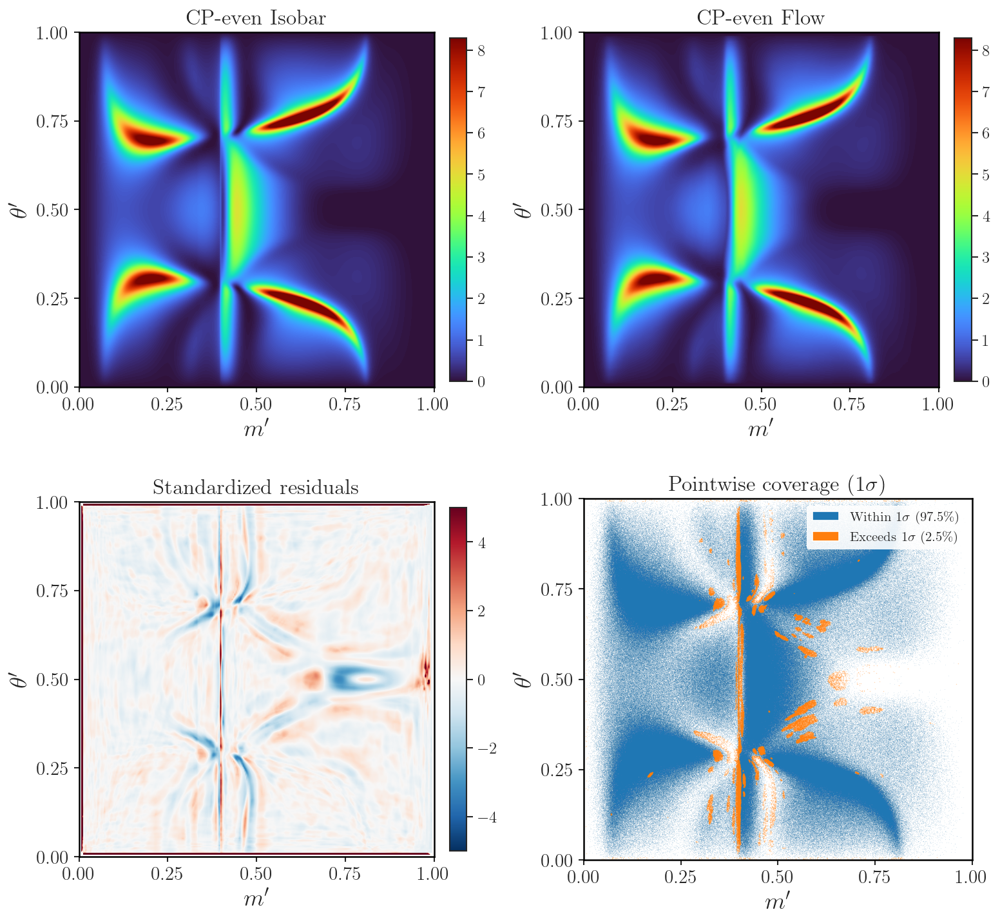


Saved: draft_figures_symmetric_flavor_cp_even_4panel.pdf


In [30]:
# Four-panel figure for CP-even: Isobar, Flow, Standardized residuals, Coverage
from matplotlib.colors import TwoSlopeNorm, ListedColormap
from matplotlib.patches import Patch

fig = plt.figure(figsize=(11, 10), dpi=150)
gs = fig.add_gridspec(
    2, 2,
    width_ratios=[1, 1],
    height_ratios=[1, 1],
    wspace=0.30,
    hspace=0.30,
    left=0.08,
    right=0.92,
    top=0.94,
    bottom=0.08,
)

ax_isobar = fig.add_subplot(gs[0, 0])
ax_flow = fig.add_subplot(gs[0, 1])
ax_zscore = fig.add_subplot(gs[1, 0])
ax_coverage = fig.add_subplot(gs[1, 1])

extent = [0.0, 1.0, 0.0, 1.0]
tick_locs = [0.0, 0.25, 0.5, 0.75, 1.0]

# Common color scale for density plots
ref_even = np.concatenate([dens_even_exact_2d.ravel(), dens_even_flow_2d.ravel()])
vmax_even = np.nanpercentile(ref_even, 99)

# Panel (a): CP-even Isobar
im_iso = ax_isobar.imshow(
    dens_even_exact_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_even, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_isobar.set_title('CP-even Isobar', fontsize=16)
ax_isobar.set_xticks(tick_locs)
ax_isobar.set_yticks(tick_locs)
ax_isobar.set_xlabel(r"$m'$", fontsize=18)
ax_isobar.set_ylabel(r"$\theta'$", fontsize=18)

cbar_iso = fig.colorbar(im_iso, ax=ax_isobar, location='right',
                        fraction=0.046, pad=0.04, shrink=0.95)
cbar_iso.ax.tick_params(labelsize=12)

# Panel (b): CP-even Flow
im_flow = ax_flow.imshow(
    dens_even_flow_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_even, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_flow.set_title('CP-even Flow', fontsize=16)
ax_flow.set_xticks(tick_locs)
ax_flow.set_yticks(tick_locs)
ax_flow.set_xlabel(r"$m'$", fontsize=18)
ax_flow.set_ylabel(r"$\theta'$", fontsize=18)

cbar_flow = fig.colorbar(im_flow, ax=ax_flow, location='right',
                         fraction=0.046, pad=0.04, shrink=0.95)
cbar_flow.ax.tick_params(labelsize=12)

# Compute Z-score for CP-even
valid_mask_even = dens_even_flow_std > 1e-10
Z_map_even = np.full_like(dens_even_exact_2d, np.nan)
Z_map_even[valid_mask_even] = (dens_even_exact_2d[valid_mask_even] - dens_even_flow_2d[valid_mask_even]) / dens_even_flow_std[valid_mask_even]

# Panel (c): Standardized residuals
z_limit_even = min(5, np.nanpercentile(np.abs(Z_map_even[valid_mask_even]), 99))
z_norm_even = TwoSlopeNorm(vcenter=0, vmin=-z_limit_even, vmax=z_limit_even)

im_z = ax_zscore.imshow(
    Z_map_even, origin='lower', extent=extent,
    cmap='RdBu_r', norm=z_norm_even, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_zscore.set_title('Standardized residuals', fontsize=16)
ax_zscore.set_xticks(tick_locs)
ax_zscore.set_yticks(tick_locs)
ax_zscore.set_xlabel(r"$m'$", fontsize=18)
ax_zscore.set_ylabel(r"$\theta'$", fontsize=18)

cbar_z = fig.colorbar(im_z, ax=ax_zscore, location='right',
                      fraction=0.046, pad=0.04, shrink=0.95)
cbar_z.ax.tick_params(labelsize=12)

# Panel (d): Coverage scatter on CP-even training data points (2 categories)
covered_even = np.zeros(len(even_data_pts), dtype=bool)
covered_even[valid_even] = ~exceeds_1sigma_even

not_covered_even = np.zeros(len(even_data_pts), dtype=bool)
not_covered_even[valid_even] = exceeds_1sigma_even

ax_coverage.scatter(even_data_pts[covered_even, 0], even_data_pts[covered_even, 1],
                    s=0.3, alpha=0.15, c='#1f77b4', rasterized=True, linewidths=0)
ax_coverage.scatter(even_data_pts[not_covered_even, 0], even_data_pts[not_covered_even, 1],
                    s=0.5, alpha=0.3, c='#ff7f0e', rasterized=True, linewidths=0)

ax_coverage.set_xlim(0, 1)
ax_coverage.set_ylim(0, 1)
ax_coverage.set_title(r'Pointwise coverage ($1\sigma$)', fontsize=16)
ax_coverage.set_xticks(tick_locs)
ax_coverage.set_yticks(tick_locs)
ax_coverage.set_xlabel(r"$m'$", fontsize=18)
ax_coverage.set_ylabel(r"$\theta'$", fontsize=18)

n_class_even = np.sum(covered_even) + np.sum(not_covered_even)
frac_covered = np.sum(covered_even) / n_class_even * 100
frac_not_covered = np.sum(not_covered_even) / n_class_even * 100

legend_elements = [
    Patch(facecolor='#1f77b4', label=f'Within $1\\sigma$ ({frac_covered:.1f}\%)'),
    Patch(facecolor='#ff7f0e', label=f'Exceeds $1\\sigma$ ({frac_not_covered:.1f}\%)'),
]
ax_coverage.legend(handles=legend_elements, loc='upper right', fontsize=10, frameon=True, 
                   facecolor='white', edgecolor='none', framealpha=0.9)

# Style all axes
for ax in (ax_isobar, ax_flow, ax_zscore, ax_coverage):
    ax.tick_params(direction="out", length=4, width=1.0, labelsize=14)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
        spine.set_color("black")

fig.savefig(f'{SAVE_PREFIX}_cp_even_4panel.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: {SAVE_PREFIX}_cp_even_4panel.pdf")

In [ ]:
# ============================================================================
# Load CP-odd training data and compute ensemble coverage at data points
# ============================================================================
odd_data_pts = np.load('representative data/dataset_001_odd.npy')
print(f'Loaded CP-odd training data: {len(odd_data_pts):,} points')

# Evaluate exact (isobar) density at training points
print('Evaluating CP-odd isobar density at training points...')
rho_iso_odd = exact_sdp_density(odd_data_pts, kind='odd')

# Evaluate ensemble flow density (mean + std) at training points
print('Evaluating CP-odd ensemble flow density at training points...')
pts_f32_odd = odd_data_pts.astype(np.float32)
pts_t_odd = torch.from_numpy(pts_f32_odd).to(device)

all_dens_odd = []
for seed in tqdm(range(N_SEEDS), desc='Ensemble at odd training pts'):
    ckpt_path = get_checkpoint_path('odd', seed)
    flow_i = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
    flow_i = load_flow_state_compat(flow_i, ckpt_path, map_location=device)
    flow_i = flow_i.to(device).eval()
    
    outs = []
    batch = 65536
    for i in range(0, len(pts_t_odd), batch):
        with torch.no_grad():
            outs.append(flow_i.log_prob(pts_t_odd[i:i + batch]))
    logp = torch.cat(outs, dim=0).detach().cpu().numpy()
    all_dens_odd.append(np.exp(logp))
    
    del flow_i
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

all_dens_odd = np.stack(all_dens_odd, axis=0)
rho_mean_odd = np.mean(all_dens_odd, axis=0)
sigma_ens_odd = np.std(all_dens_odd, axis=0)

# Coverage classification
valid_odd = sigma_ens_odd > 1e-15
residual_odd = np.abs(rho_iso_odd[valid_odd] - rho_mean_odd[valid_odd])
exceeds_1sigma_odd = residual_odd > sigma_ens_odd[valid_odd]
f_cov_odd = np.mean(~exceeds_1sigma_odd)

print(f'\nCP-odd results ({len(odd_data_pts):,} training points):')
print(f'  f_cov (fraction within 1σ): {f_cov_odd:.4f} ({f_cov_odd*100:.2f}%)')


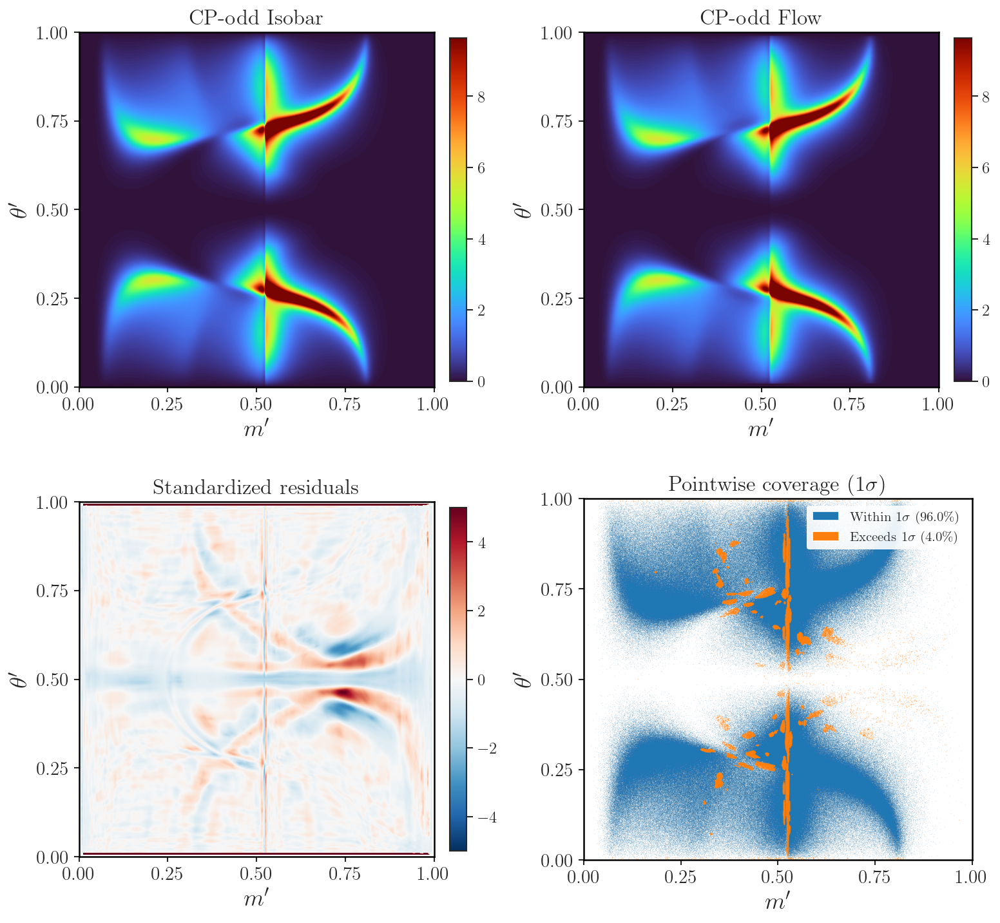


Saved: draft_figures_symmetric_flavor_cp_odd_4panel.pdf


In [33]:
# Four-panel figure for CP-odd: Isobar, Flow, Standardized residuals, Coverage
from matplotlib.colors import TwoSlopeNorm, ListedColormap
from matplotlib.patches import Patch

fig = plt.figure(figsize=(11, 10), dpi=150)
gs = fig.add_gridspec(
    2, 2,
    width_ratios=[1, 1],
    height_ratios=[1, 1],
    wspace=0.30,
    hspace=0.30,
    left=0.08,
    right=0.92,
    top=0.94,
    bottom=0.08,
)

ax_isobar = fig.add_subplot(gs[0, 0])
ax_flow = fig.add_subplot(gs[0, 1])
ax_zscore = fig.add_subplot(gs[1, 0])
ax_coverage = fig.add_subplot(gs[1, 1])

extent = [0.0, 1.0, 0.0, 1.0]
tick_locs = [0.0, 0.25, 0.5, 0.75, 1.0]

# Common color scale for density plots
ref_odd = np.concatenate([dens_odd_exact_2d.ravel(), dens_odd_flow_2d.ravel()])
vmax_odd = np.nanpercentile(ref_odd, 99)

# Panel (a): CP-odd Isobar
im_iso = ax_isobar.imshow(
    dens_odd_exact_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_odd, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_isobar.set_title('CP-odd Isobar', fontsize=16)
ax_isobar.set_xticks(tick_locs)
ax_isobar.set_yticks(tick_locs)
ax_isobar.set_xlabel(r"$m'$", fontsize=18)
ax_isobar.set_ylabel(r"$\theta'$", fontsize=18)

cbar_iso = fig.colorbar(im_iso, ax=ax_isobar, location='right',
                        fraction=0.046, pad=0.04, shrink=0.95)
cbar_iso.ax.tick_params(labelsize=12)

# Panel (b): CP-odd Flow
im_flow = ax_flow.imshow(
    dens_odd_flow_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_odd, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_flow.set_title('CP-odd Flow', fontsize=16)
ax_flow.set_xticks(tick_locs)
ax_flow.set_yticks(tick_locs)
ax_flow.set_xlabel(r"$m'$", fontsize=18)
ax_flow.set_ylabel(r"$\theta'$", fontsize=18)

cbar_flow = fig.colorbar(im_flow, ax=ax_flow, location='right',
                         fraction=0.046, pad=0.04, shrink=0.95)
cbar_flow.ax.tick_params(labelsize=12)

# Compute Z-score for CP-odd
valid_mask_odd = dens_odd_flow_std > 1e-10
Z_map_odd = np.full_like(dens_odd_exact_2d, np.nan)
Z_map_odd[valid_mask_odd] = (dens_odd_exact_2d[valid_mask_odd] - dens_odd_flow_2d[valid_mask_odd]) / dens_odd_flow_std[valid_mask_odd]

# Panel (c): Standardized residuals
z_limit_odd = min(5, np.nanpercentile(np.abs(Z_map_odd[valid_mask_odd]), 99))
z_norm_odd = TwoSlopeNorm(vcenter=0, vmin=-z_limit_odd, vmax=z_limit_odd)

im_z = ax_zscore.imshow(
    Z_map_odd, origin='lower', extent=extent,
    cmap='RdBu_r', norm=z_norm_odd, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_zscore.set_title('Standardized residuals', fontsize=16)
ax_zscore.set_xticks(tick_locs)
ax_zscore.set_yticks(tick_locs)
ax_zscore.set_xlabel(r"$m'$", fontsize=18)
ax_zscore.set_ylabel(r"$\theta'$", fontsize=18)

cbar_z = fig.colorbar(im_z, ax=ax_zscore, location='right',
                      fraction=0.046, pad=0.04, shrink=0.95)
cbar_z.ax.tick_params(labelsize=12)

# Panel (d): Coverage scatter on CP-odd training data points (2 categories)
covered_odd = np.zeros(len(odd_data_pts), dtype=bool)
covered_odd[valid_odd] = ~exceeds_1sigma_odd

not_covered_odd = np.zeros(len(odd_data_pts), dtype=bool)
not_covered_odd[valid_odd] = exceeds_1sigma_odd

ax_coverage.scatter(odd_data_pts[covered_odd, 0], odd_data_pts[covered_odd, 1],
                    s=0.3, alpha=0.15, c='#1f77b4', rasterized=True, linewidths=0)
ax_coverage.scatter(odd_data_pts[not_covered_odd, 0], odd_data_pts[not_covered_odd, 1],
                    s=0.5, alpha=0.3, c='#ff7f0e', rasterized=True, linewidths=0)

ax_coverage.set_xlim(0, 1)
ax_coverage.set_ylim(0, 1)
ax_coverage.set_title(r'Pointwise coverage ($1\sigma$)', fontsize=16)
ax_coverage.set_xticks(tick_locs)
ax_coverage.set_yticks(tick_locs)
ax_coverage.set_xlabel(r"$m'$", fontsize=18)
ax_coverage.set_ylabel(r"$\theta'$", fontsize=18)

n_class_odd = np.sum(covered_odd) + np.sum(not_covered_odd)
frac_covered = np.sum(covered_odd) / n_class_odd * 100
frac_not_covered = np.sum(not_covered_odd) / n_class_odd * 100

legend_elements = [
    Patch(facecolor='#1f77b4', label=f'Within $1\\sigma$ ({frac_covered:.1f}\%)'),
    Patch(facecolor='#ff7f0e', label=f'Exceeds $1\\sigma$ ({frac_not_covered:.1f}\%)'),
]
ax_coverage.legend(handles=legend_elements, loc='upper right', fontsize=10, frameon=True, 
                   facecolor='white', edgecolor='none', framealpha=0.9)

# Style all axes
for ax in (ax_isobar, ax_flow, ax_zscore, ax_coverage):
    ax.tick_params(direction="out", length=4, width=1.0, labelsize=14)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
        spine.set_color("black")

fig.savefig(f'{SAVE_PREFIX}_cp_odd_4panel.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: {SAVE_PREFIX}_cp_odd_4panel.pdf")

# Coverage on Training Data Points

Evaluate pointwise coverage using $N_{\rm grid} = N_{\rm flav} = 2\times10^6$ square Dalitz points distributed according to the isobar model density (the same points used for training). The coverage fraction is

$$f_{\rm cov} = \frac{1}{N_{\rm grid}}\sum_{k=1}^{N_{\rm grid}} \Theta\!\left[\,|\rho_{\rm iso}(z_k) - \langle\rho(z_k)\rangle|\;-\;\sigma_{\rm ens}(z_k)\right]$$

In [ ]:
# ============================================================================
# Load flavor training data and compute ensemble coverage at data points
# ============================================================================
data_pts = np.load('representative data/dataset_001_flavor.npy')
print(f'Loaded flavor training data: {len(data_pts):,} points')

# Evaluate exact (isobar) density at training points
print('Evaluating isobar density at training points...')
rho_iso = exact_sdp_density(data_pts, kind=FLOW_KIND)

# Evaluate ensemble flow density (mean + std) at training points
print('Evaluating ensemble flow density at training points...')
pts_f32 = data_pts.astype(np.float32)
pts_t = torch.from_numpy(pts_f32).to(device)

all_dens_data = []
for seed in tqdm(range(N_SEEDS), desc=f'Ensemble at training pts ({FLOW_KIND})'):
    ckpt_path = get_checkpoint_path(FLOW_KIND, seed)
    flow_i = create_flow(num_flows=12, hidden_features=128, num_bins=24, device=device)
    flow_i = load_flow_state_compat(flow_i, ckpt_path, map_location=device)
    flow_i = flow_i.to(device).eval()
    
    outs = []
    batch = 65536
    for i in range(0, len(pts_t), batch):
        with torch.no_grad():
            outs.append(flow_i.log_prob(pts_t[i:i + batch]))
    logp = torch.cat(outs, dim=0).detach().cpu().numpy()
    all_dens_data.append(np.exp(logp))
    
    del flow_i
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

all_dens_data = np.stack(all_dens_data, axis=0)  # (N_SEEDS, N_FLAV)
rho_mean = np.mean(all_dens_data, axis=0)
sigma_ens = np.std(all_dens_data, axis=0)

# Compute f_cov: Heaviside[ |rho_iso - <rho>| - sigma_ens ]
# Theta = 1 where deviation exceeds 1-sigma band
valid = sigma_ens > 1e-15
residual = np.abs(rho_iso[valid] - rho_mean[valid])
exceeds_1sigma = residual > sigma_ens[valid]
f_cov = np.mean(~exceeds_1sigma)

print(f'\nResults ({len(data_pts):,} training points):')
print(f'  f_cov (fraction within 1σ): {f_cov:.4f} ({f_cov*100:.2f}%) [expected ~68.3%]')
print(f'  Fraction exceeding 1σ: {1 - f_cov:.4f} ({(1 - f_cov)*100:.2f}%)')


In [ ]:
# Scatter plot: coverage on training data points
from matplotlib.patches import Patch

covered = np.zeros(len(data_pts), dtype=bool)
covered[valid] = ~exceeds_1sigma

not_covered = np.zeros(len(data_pts), dtype=bool)
not_covered[valid] = exceeds_1sigma

n_classified = np.sum(covered) + np.sum(not_covered)
frac_cov_pct = np.sum(covered) / n_classified * 100
frac_ncov_pct = np.sum(not_covered) / n_classified * 100

fig, ax = plt.subplots(figsize=(7, 6.5), dpi=150)

ax.scatter(data_pts[covered, 0], data_pts[covered, 1],
           s=0.3, alpha=0.15, c='#1f77b4', rasterized=True, linewidths=0)
ax.scatter(data_pts[not_covered, 0], data_pts[not_covered, 1],
           s=0.5, alpha=0.3, c='#ff7f0e', rasterized=True, linewidths=0)

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_xlabel(r"$m'$", fontsize=18)
ax.set_ylabel(r"$\theta'$", fontsize=18)
ax.set_title(r'Pointwise coverage ($1\sigma$) on training data', fontsize=16)
ax.set_aspect('equal')
ax.tick_params(direction='out', length=4, width=1.0, labelsize=14)
for spine in ax.spines.values():
    spine.set_linewidth(1.2)
    spine.set_color('black')

legend_elements = [
    Patch(facecolor='#1f77b4', label=f'Within $1\\sigma$ ({frac_cov_pct:.1f}\%%)'),
    Patch(facecolor='#ff7f0e', label=f'Exceeds $1\\sigma$ ({frac_ncov_pct:.1f}\%%)'),
]
ax.legend(handles=legend_elements, loc='upper right', fontsize=12,
          frameon=True, facecolor='white', edgecolor='none', framealpha=0.9)

fig.savefig(f'{SAVE_PREFIX}_coverage_training_data.pdf', dpi=300, bbox_inches='tight')
plt.show()
print(f'\nSaved: {SAVE_PREFIX}_coverage_training_data.pdf')
print(f'f_cov = {f_cov:.4f}')

In [1]:
# Combined four-panel figure: Isobar, Ensemble Flow, Z-score, Coverage
from matplotlib.colors import TwoSlopeNorm, ListedColormap
from matplotlib.patches import Patch
from matplotlib.ticker import ScalarFormatter
from matplotlib.lines import Line2D

fig = plt.figure(figsize=(11, 10), dpi=150)
gs = fig.add_gridspec(
    2, 2,
    width_ratios=[1, 1],
    height_ratios=[1, 1],
    wspace=0.30,
    hspace=0.30,
    left=0.08,
    right=0.92,
    top=0.94,
    bottom=0.08,
)

ax_isobar = fig.add_subplot(gs[0, 0])
ax_ensemble = fig.add_subplot(gs[0, 1])
ax_zscore = fig.add_subplot(gs[1, 0])
ax_coverage = fig.add_subplot(gs[1, 1])

extent = [0.0, 1.0, 0.0, 1.0]
tick_locs = [0.0, 0.25, 0.5, 0.75, 1.0]

# Common color scale for density plots
ref = np.concatenate([dens_exact_ens_2d.ravel(), dens_ensemble_2d.ravel()])
vmax_dens = np.nanpercentile(ref, 99)

# Panel (a): Isobar density
im_iso = ax_isobar.imshow(
    dens_exact_ens_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_dens, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_isobar.set_title('Isobar', fontsize=16)
ax_isobar.set_xticks(tick_locs)
ax_isobar.set_yticks(tick_locs)
ax_isobar.set_xlabel(r"$m'$", fontsize=18)
ax_isobar.set_ylabel(r"$\theta'$", fontsize=18)

cbar_iso = fig.colorbar(im_iso, ax=ax_isobar, location='right',
                        fraction=0.046, pad=0.04, shrink=0.95)
cbar_iso.ax.tick_params(labelsize=12)

# Panel (b): Ensemble flow density
im_ens = ax_ensemble.imshow(
    dens_ensemble_2d, origin='lower', extent=extent,
    cmap='turbo', vmin=0.0, vmax=vmax_dens, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_ensemble.set_title('Flow ensemble mean', fontsize=16)
ax_ensemble.set_xticks(tick_locs)
ax_ensemble.set_yticks(tick_locs)
ax_ensemble.set_xlabel(r"$m'$", fontsize=18)
ax_ensemble.set_ylabel(r"$\theta'$", fontsize=18)

cbar_ens = fig.colorbar(im_ens, ax=ax_ensemble, location='right',
                        fraction=0.046, pad=0.04, shrink=0.95)
cbar_ens.ax.tick_params(labelsize=12)

# Panel (c): Standardized residuals
z_limit = min(5, np.nanpercentile(np.abs(Z_map[valid_mask]), 99))
z_norm = TwoSlopeNorm(vcenter=0, vmin=-z_limit, vmax=z_limit)

im_z = ax_zscore.imshow(
    Z_map, origin='lower', extent=extent,
    cmap='RdBu_r', norm=z_norm, aspect='equal',
    interpolation='bilinear', rasterized=True
)
ax_zscore.set_title('Standardized residuals', fontsize=16)
ax_zscore.set_xticks(tick_locs)
ax_zscore.set_yticks(tick_locs)
ax_zscore.set_xlabel(r"$m'$", fontsize=18)
ax_zscore.set_ylabel(r"$\theta'$", fontsize=18)

cbar_z = fig.colorbar(im_z, ax=ax_zscore, location='right',
                      fraction=0.046, pad=0.04, shrink=0.95)
cbar_z.ax.tick_params(labelsize=12)

# Panel (d): Coverage scatter on training data points (2 categories)
covered = np.zeros(len(data_pts), dtype=bool)
covered[valid] = ~exceeds_1sigma

not_covered = np.zeros(len(data_pts), dtype=bool)
not_covered[valid] = exceeds_1sigma

ax_coverage.scatter(data_pts[covered, 0], data_pts[covered, 1],
                    s=0.3, alpha=0.15, c='#1f77b4', rasterized=True, linewidths=0)
ax_coverage.scatter(data_pts[not_covered, 0], data_pts[not_covered, 1],
                    s=0.5, alpha=0.3, c='#ff7f0e', rasterized=True, linewidths=0)

ax_coverage.set_xlim(0, 1)
ax_coverage.set_ylim(0, 1)
ax_coverage.set_title(r'Pointwise coverage ($1\sigma$)', fontsize=16)
ax_coverage.set_xticks(tick_locs)
ax_coverage.set_yticks(tick_locs)
ax_coverage.set_xlabel(r"$m'$", fontsize=18)
ax_coverage.set_ylabel(r"$\theta'$", fontsize=18)

n_classified = np.sum(covered) + np.sum(not_covered)
frac_cov_pct = np.sum(covered) / n_classified * 100
frac_ncov_pct = np.sum(not_covered) / n_classified * 100

legend_elements = [
    Patch(facecolor='#1f77b4', label=f'Within $1\\sigma$ ({frac_cov_pct:.1f}\%)'),
    Patch(facecolor='#ff7f0e', label=f'Exceeds $1\\sigma$ ({frac_ncov_pct:.1f}\%)'),
]
ax_coverage.legend(handles=legend_elements, loc='upper right', fontsize=10, frameon=True,
                   facecolor='white', edgecolor='none', framealpha=0.9)

# Style all axes
for ax in (ax_isobar, ax_ensemble, ax_zscore, ax_coverage):
    ax.tick_params(direction="out", length=4, width=1.0, labelsize=14)
    for spine in ax.spines.values():
        spine.set_linewidth(1.2)
        spine.set_color("black")

fig.savefig(f'{SAVE_PREFIX}_ensemble_combined_4panel.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"\nSaved: {SAVE_PREFIX}_ensemble_combined_4panel.pdf")
print(f'f_cov = {f_cov:.4f}')

NameError: name 'plt' is not defined